In [1]:
import pandas as pd
import scanpy as sc
import h5py
import itertools
import anndata
import numpy as np
import CococoNet_reader
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from itertools import permutations
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [2]:
all_orthodb_groups = pd.read_csv('/data/passala/OrthoDB_data/NCBI_data/og_2_Genes_with_network_id.csv')
arabidopsis_groups = all_orthodb_groups.loc[all_orthodb_groups['Species']== 3702]
arabidopsis_groups

,Orthogroup,Gene,Species,Ortholevel,Orthodb Gene,Symbol
8,10009at3193,3702_0:006584,3702,3193,3702_0:006584,AT5G42200
80,10092at3193,3702_0:001f5f,3702,3193,3702_0:001f5f,AT2G26300
125,10147at3193,3702_0:000e32,3702,3193,3702_0:000e32,AT1G73910
126,10147at3193,3702_0:0018a2,3702,3193,3702_0:0018a2,AT1G18450
215,10228at3193,3702_0:000573,3702,3193,3702_0:000573,AT1G49040
...,...,...,...,...,...,...
502744,9877at3193,3702_0:004152,3702,3193,3702_0:004152,AT3G58740
502786,9919at3193,3702_0:00114d,3702,3193,3702_0:00114d,AT1G15440
502820,9942at3193,3702_0:002571,3702,3193,3702_0:002571,AT2G44100
502821,9942at3193,3702_0:003134,3702,3193,3702_0:003134,AT3G59920


In [3]:
arabidopsis_groups_formatted = arabidopsis_groups[['Orthogroup','Symbol']]
arabidopsis_groups_formatted['Present'] = 1 
arabidopsis_groups_formatted = arabidopsis_groups_formatted.drop_duplicates()
arabidopsis_groups_formatted

/tmp/ipykernel_1790968/56406898.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arabidopsis_groups_formatted['Present'] = 1


,Orthogroup,Symbol,Present
8,10009at3193,AT5G42200,1
80,10092at3193,AT2G26300,1
125,10147at3193,AT1G73910,1
126,10147at3193,AT1G18450,1
215,10228at3193,AT1G49040,1
...,...,...,...
502744,9877at3193,AT3G58740,1
502786,9919at3193,AT1G15440,1
502820,9942at3193,AT2G44100,1
502821,9942at3193,AT3G59920,1


In [4]:
wide_groups = arabidopsis_groups_formatted.pivot(columns = 'Symbol', index = 'Orthogroup',values = 'Present')
wide_groups

Symbol,AT1G01010,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01070,AT1G01080,AT1G01090,AT1G01100,...,rps19,rps2,rps3,rps4,rps7,rps8,ycf1,ycf2,ycf3,ycf4
Orthogroup,,,,,,,,,,,,,,,,,,,,,
10009at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10092at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10147at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10228at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10238at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9828at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9836at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9877at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
wide_groups = wide_groups.loc[wide_groups.sum(axis = 1) > 1 ]
wide_groups

Symbol,AT1G01010,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01070,AT1G01080,AT1G01090,AT1G01100,...,rps19,rps2,rps3,rps4,rps7,rps8,ycf1,ycf2,ycf3,ycf4
Orthogroup,,,,,,,,,,,,,,,,,,,,,
10147at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10488at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10772at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10950at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
109808at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9601at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9609at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9828at3193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
list_of_all_combos = []
for group in wide_groups.index:
    genes_in_group = wide_groups.loc[group].loc[wide_groups.loc[group] == 1].index.to_list()
    all_combos = list(itertools.combinations(genes_in_group,2))
    list_of_all_combos.extend(all_combos)

In [7]:
len(list_of_all_combos)

25002

In [8]:
arab_cococonet = CococoNet_reader.read_cococonet('arabidopsis')

In [9]:
arab_cococonet_1_set_to_zero = arab_cococonet.replace(1,0)
arab_cococonet_1_set_to_zero

,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01070,AT1G01080,AT1G01090,AT1G01100,AT1G01110,...,ATCG01070,ATCG01080,ATCG01090,ATCG01100,ATCG01110,ATCG01120,ATCG01130,ATCG01180,ATCG01210,ATCG01310
AT1G01020,0.000000,0.676041,0.885107,0.916603,0.167027,0.625596,0.801175,0.866369,0.954286,0.715750,...,0.111731,0.193853,0.261697,0.299060,0.321617,0.287853,0.559907,0.017205,0.011806,0.091015
AT1G01030,0.676041,0.000000,0.707718,0.515532,0.420354,0.292083,0.687003,0.626281,0.483536,0.570675,...,0.245167,0.215414,0.255414,0.306986,0.308402,0.270118,0.463394,0.083490,0.059014,0.108780
AT1G01040,0.885107,0.707718,0.000000,0.836387,0.545101,0.701558,0.656258,0.857046,0.657204,0.650843,...,0.155183,0.230038,0.149740,0.334558,0.287951,0.186425,0.219380,0.032348,0.018332,0.057761
AT1G01050,0.916603,0.515532,0.836387,0.000000,0.562112,0.726964,0.837948,0.928252,0.952045,0.640223,...,0.089440,0.177388,0.164935,0.236661,0.251851,0.213062,0.412583,0.046082,0.029016,0.086736
AT1G01060,0.167027,0.420354,0.545101,0.562112,0.000000,0.327202,0.242215,0.304953,0.217415,0.077569,...,0.082518,0.125455,0.103488,0.187982,0.195059,0.125488,0.212731,0.061676,0.057518,0.044208
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCG01120,0.287853,0.270118,0.186425,0.213062,0.125488,0.083681,0.364707,0.333718,0.237716,0.149145,...,0.858389,0.905572,0.926062,0.941864,0.954421,0.000000,0.969018,0.450607,0.357960,0.410586
ATCG01130,0.559907,0.463394,0.219380,0.412583,0.212731,0.077222,0.625678,0.496059,0.428496,0.226147,...,0.881835,0.936241,0.946935,0.958553,0.960399,0.969018,0.000000,0.467233,0.412343,0.483002
ATCG01180,0.017205,0.083490,0.032348,0.046082,0.061676,0.022381,0.090228,0.069825,0.028903,0.015799,...,0.751869,0.781811,0.740045,0.745181,0.676666,0.450607,0.467233,0.000000,0.999090,0.579657
ATCG01210,0.011806,0.059014,0.018332,0.029016,0.057518,0.026014,0.062831,0.043944,0.015468,0.018706,...,0.687306,0.710940,0.676507,0.687223,0.567304,0.357960,0.412343,0.999090,0.000000,0.511263


In [10]:
top_10_arab_genes = np.array(
    [arab_cococonet_1_set_to_zero[c].nlargest(10).index.values for c in arab_cococonet_1_set_to_zero]
)  # using pair list above, cut down top 10 list to relevant genes, probably by adding list as a column in panda and then filtering panda to index of pair list
top_10_arab_genes_dataframe = pd.DataFrame(
    data=top_10_arab_genes,
    index=arab_cococonet_1_set_to_zero.index,
    columns=[
        "One",
        "Two",
        "Three",
        "Four",
        "Five",
        "Six",
        "Seven",
        "Eight",
        "Nine",
        "Ten",
    ],
)
top_10_arab_genes_dataframe

,One,Two,Three,Four,Five,Six,Seven,Eight,Nine,Ten
AT1G01020,AT1G30590,AT3G15010,AT3G54480,AT2G48100,AT5G02770,AT3G26920,AT5G66240,AT5G59460,AT5G67610,AT2G45640
AT1G01030,AT1G31650,AT3G11170,AT5G50860,AT2G46810,AT5G67260,AT2G13440,AT2G43950,AT2G28540,AT2G45950,AT3G09670
AT1G01040,AT4G00060,AT3G54230,AT5G35210,AT1G55325,AT1G73960,AT2G29210,AT4G16310,AT5G22760,AT2G27980,AT1G79350
AT1G01050,AT2G42210,AT2G17390,AT5G36230,AT4G02580,AT3G14290,AT5G40810,AT1G09150,AT5G10460,AT5G66510,AT4G06599
AT1G01060,AT3G09600,AT2G46830,AT5G64940,AT4G38960,AT3G12320,AT3G54500,AT4G15430,AT2G31380,AT5G15950,AT3G01060
...,...,...,...,...,...,...,...,...,...,...
ATCG01120,ATCG01130,ATCG01110,ATCG00800,ATCG00740,ATCG01100,ATCG00770,ATCG00650,ATCG01010,ATCG00660,ATCG01090
ATCG01130,ATCG00800,ATCG00790,ATCG00740,ATCG00810,ATCG00650,ATCG00780,ATCG00150,ATCG00770,ATCG00040,ATCG00530
ATCG01180,ATCG00950,ATCG01210,ATCG00920,ATCG00020,ATCG00490,ATCG00680,ENSRNA049495549,ATCG00350,ATCG00720,ATCG00340
ATCG01210,ATCG01180,ATCG00950,ATCG00920,ATCG00490,ENSRNA049495549,ATCG00020,ATCG00680,ATCG00350,ATCG00280,ATCG00340


In [11]:
tidy_top_10 = top_10_arab_genes_dataframe.melt(ignore_index= False)
tidy_top_10
zipped_pairs = zip(tuple(tidy_top_10.index.to_list()),tuple(tidy_top_10['value'].to_list()))

In [12]:
binary_masked_cococonet = pd.DataFrame(data = 0, columns = arab_cococonet.columns, index = arab_cococonet.index)
#binary_masked_cococonet.loc[zip(tuple(tidy_top_10.index.to_list()),tuple(tidy_top_10['value'].to_list()))] = 1
#binary_masked_cococonet.sum(axis =0)
for row,column in zipped_pairs:
    binary_masked_cococonet.at[row,column] = 1
binary_masked_cococonet

,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01070,AT1G01080,AT1G01090,AT1G01100,AT1G01110,...,ATCG01070,ATCG01080,ATCG01090,ATCG01100,ATCG01110,ATCG01120,ATCG01130,ATCG01180,ATCG01210,ATCG01310
AT1G01020,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AT1G01030,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AT1G01040,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AT1G01050,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AT1G01060,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCG01120,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,0,1,0,0,0
ATCG01130,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ATCG01180,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
ATCG01210,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [13]:
ranked_columns_cococonet = arab_cococonet_1_set_to_zero.rank()
ranked_columns_cococonet

,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01070,AT1G01080,AT1G01090,AT1G01100,AT1G01110,...,ATCG01070,ATCG01080,ATCG01090,ATCG01100,ATCG01110,ATCG01120,ATCG01130,ATCG01180,ATCG01210,ATCG01310
AT1G01020,1.0,19613.0,16301.0,16662.0,10398.0,16067.0,16385.0,15559.0,19078.0,17115.0,...,15836.0,17411.0,19327.0,18170.0,19393.0,19923.0,20465.0,9647.0,8750.0,16876.0
AT1G01030,8761.0,1.0,10054.0,4915.0,18912.0,5101.0,13059.0,8258.0,6841.0,11922.0,...,20305.0,18191.0,19221.0,18392.0,19070.0,19477.0,19410.0,18431.0,18227.0,17986.0
AT1G01040,15837.0,20260.0,1.0,12516.0,20006.0,18717.0,12209.0,15125.0,10507.0,14760.0,...,18311.0,18627.0,14960.0,19026.0,18501.0,15271.0,10720.0,14046.0,12006.0,12286.0
AT1G01050,17513.0,13479.0,14421.0,1.0,20113.0,19475.0,17388.0,18521.0,19016.0,14385.0,...,13704.0,16605.0,16019.0,15844.0,17125.0,16993.0,18302.0,15978.0,14939.0,16522.0
AT1G01060,1061.0,9642.0,6470.0,5598.0,1.0,6060.0,4102.0,3500.0,2546.0,1273.0,...,12914.0,12780.0,10325.0,13022.0,14097.0,10186.0,10366.0,17280.0,18107.0,9080.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCG01120,2524.0,5414.0,1374.0,1136.0,8078.0,819.0,5904.0,3898.0,2833.0,2326.0,...,20816.0,20814.0,20832.0,20822.0,20850.0,1.0,20866.0,20771.0,20768.0,20809.0
ATCG01130,6537.0,11291.0,1801.0,3401.0,12757.0,719.0,11419.0,6108.0,5855.0,3634.0,...,20830.0,20833.0,20846.0,20834.0,20858.0,20879.0,1.0,20775.0,20778.0,20844.0
ATCG01180,40.0,1338.0,42.0,61.0,4293.0,109.0,1959.0,739.0,206.0,374.0,...,20797.0,20797.0,20795.0,20790.0,20792.0,20782.0,19472.0,1.0,20879.0,20873.0
ATCG01210,26.0,769.0,18.0,22.0,4019.0,139.0,1483.0,496.0,96.0,415.0,...,20792.0,20788.0,20787.0,20779.0,20778.0,20671.0,18293.0,20878.0,1.0,20860.0


In [14]:
ranked_columns_cococonet.sum(axis = 1)

AT1G01020    311475415.0
AT1G01030    157556588.0
AT1G01040    304261660.0
AT1G01050    337602461.0
AT1G01060     72540424.0
                ...     
ATCG01120     45841333.0
ATCG01130     80126213.0
ATCG01180     19750802.0
ATCG01210     16992829.0
ATCG01310     25047972.0
Length: 20879, dtype: float64

In [15]:
dot_product_cococonet = binary_masked_cococonet.dot(ranked_columns_cococonet)

In [16]:
subtract_minimum = dot_product_cococonet-65 # This is 11+10+9+8+7+6+5+4+3+2
subtract_minimum

,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01070,AT1G01080,AT1G01090,AT1G01100,AT1G01110,...,ATCG01070,ATCG01080,ATCG01090,ATCG01100,ATCG01110,ATCG01120,ATCG01130,ATCG01180,ATCG01210,ATCG01310
AT1G01020,208680.0,176180.0,185739.0,187173.0,125884.0,170923.0,155527.0,166523.0,187956.0,182540.0,...,116094.0,140149.0,148434.0,149027.0,155250.0,166779.0,171395.0,85583.0,73048.0,122589.0
AT1G01030,148953.0,208680.0,152892.0,155316.0,194126.0,93495.0,190789.0,176558.0,142823.0,125016.0,...,196527.0,198465.0,200808.0,201173.0,202585.0,197346.0,198597.0,175512.0,164357.0,188518.0
AT1G01040,175725.0,194100.0,208680.0,156815.0,185277.0,176800.0,136356.0,176026.0,118214.0,166584.0,...,178412.0,179377.0,161152.0,187786.0,187269.0,147635.0,124187.0,123266.0,96951.0,124388.0
AT1G01050,197210.0,145452.0,157486.0,208680.0,156471.0,169853.0,179658.0,196644.0,198576.0,163158.0,...,96257.0,126125.0,137239.0,138213.0,149667.0,171806.0,179039.0,107787.0,96482.0,149529.0
AT1G01060,34409.0,135159.0,73268.0,66212.0,208680.0,88455.0,76307.0,58290.0,37856.0,22635.0,...,139426.0,131295.0,122000.0,135071.0,135086.0,117037.0,114126.0,162089.0,167106.0,126119.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCG01120,40037.0,91874.0,28435.0,22250.0,114654.0,7195.0,91406.0,57002.0,26816.0,32147.0,...,208461.0,208481.0,187681.0,187633.0,187748.0,208680.0,187742.0,208005.0,207977.0,208360.0
ATCG01130,51648.0,124061.0,37468.0,31752.0,124584.0,8210.0,124369.0,73139.0,41105.0,43143.0,...,208316.0,208351.0,208444.0,208438.0,208513.0,208609.0,208680.0,207926.0,207901.0,208468.0
ATCG01180,4747.0,28961.0,7426.0,4052.0,62440.0,2482.0,40623.0,20543.0,2782.0,7432.0,...,208279.0,208228.0,208189.0,208198.0,208029.0,206923.0,197675.0,208680.0,187799.0,208204.0
ATCG01210,4482.0,27980.0,7337.0,3789.0,61702.0,2181.0,41393.0,21308.0,3078.0,8139.0,...,208268.0,208222.0,208185.0,208194.0,208021.0,207018.0,198838.0,187801.0,208680.0,208257.0


In [17]:
function_conservations_scores = subtract_minimum/(subtract_minimum.max().max() - subtract_minimum.min().min())
function_conservations_scores

,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01070,AT1G01080,AT1G01090,AT1G01100,AT1G01110,...,ATCG01070,ATCG01080,ATCG01090,ATCG01100,ATCG01110,ATCG01120,ATCG01130,ATCG01180,ATCG01210,ATCG01310
AT1G01020,1.000000,0.844259,0.890066,0.896938,0.603239,0.819067,0.745289,0.797983,0.900690,0.874736,...,0.556325,0.671598,0.711300,0.714141,0.743962,0.799209,0.821329,0.410116,0.350048,0.587450
AT1G01030,0.713787,1.000000,0.732662,0.744278,0.930257,0.448030,0.914266,0.846071,0.684412,0.599080,...,0.941763,0.951049,0.962277,0.964026,0.970793,0.945687,0.951682,0.841058,0.787603,0.903383
AT1G01040,0.842079,0.930132,1.000000,0.751462,0.887852,0.847230,0.653422,0.843521,0.566485,0.798275,...,0.854955,0.859579,0.772245,0.899875,0.897398,0.707471,0.595107,0.590694,0.464592,0.596071
AT1G01050,0.945035,0.697010,0.754677,1.000000,0.749813,0.813940,0.860926,0.942323,0.951581,0.781857,...,0.461266,0.604394,0.657653,0.662320,0.717208,0.823299,0.857960,0.516518,0.462344,0.716547
AT1G01060,0.164889,0.647685,0.351102,0.317290,1.000000,0.423879,0.365665,0.279327,0.181407,0.108468,...,0.668133,0.629169,0.584627,0.647264,0.647336,0.560844,0.546895,0.776735,0.800776,0.604366
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCG01120,0.191858,0.440263,0.136261,0.106623,0.549425,0.034479,0.438020,0.273155,0.128503,0.154049,...,0.998951,0.999046,0.899372,0.899142,0.899693,1.000000,0.899665,0.996765,0.996631,0.998467
ATCG01130,0.247499,0.594504,0.179548,0.152156,0.597010,0.039343,0.595979,0.350484,0.196976,0.206742,...,0.998256,0.998423,0.998869,0.998840,0.999200,0.999660,1.000000,0.996387,0.996267,0.998984
ATCG01180,0.022748,0.138782,0.035586,0.019417,0.299214,0.011894,0.194666,0.098443,0.013331,0.035614,...,0.998078,0.997834,0.997647,0.997690,0.996880,0.991580,0.947264,1.000000,0.899938,0.997719
ATCG01210,0.021478,0.134081,0.035159,0.018157,0.295678,0.010451,0.198356,0.102108,0.014750,0.039002,...,0.998026,0.997805,0.997628,0.997671,0.996842,0.992036,0.952837,0.899947,1.000000,0.997973


In [18]:
averaged_scores = (function_conservations_scores.T+function_conservations_scores)/2
averaged_scores

,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01070,AT1G01080,AT1G01090,AT1G01100,AT1G01110,...,ATCG01070,ATCG01080,ATCG01090,ATCG01100,ATCG01110,ATCG01120,ATCG01130,ATCG01180,ATCG01210,ATCG01310
AT1G01020,1.000000,0.779023,0.866072,0.920987,0.384064,0.555647,0.658987,0.768219,0.909019,0.721250,...,0.317798,0.367486,0.405614,0.403124,0.444976,0.495534,0.534414,0.216432,0.185763,0.376200
AT1G01030,0.779023,1.000000,0.831397,0.720644,0.788971,0.344832,0.922408,0.842141,0.632780,0.626962,...,0.618730,0.622372,0.636429,0.630274,0.670687,0.692975,0.773093,0.489920,0.460842,0.657456
AT1G01040,0.866072,0.831397,1.000000,0.753069,0.619477,0.641072,0.520615,0.745891,0.496193,0.733379,...,0.470611,0.474466,0.434292,0.502624,0.511242,0.421866,0.387327,0.313140,0.249875,0.365579
AT1G01050,0.920987,0.720644,0.753069,1.000000,0.533551,0.578194,0.766741,0.875403,0.924959,0.679797,...,0.253249,0.324384,0.356333,0.358319,0.396933,0.464961,0.505058,0.267968,0.240251,0.419863
AT1G01060,0.384064,0.788971,0.619477,0.533551,1.000000,0.521313,0.547798,0.383199,0.401438,0.293097,...,0.535094,0.506026,0.516607,0.534649,0.561750,0.555135,0.571952,0.537974,0.548227,0.546813
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCG01120,0.495534,0.692975,0.421866,0.464961,0.555135,0.117879,0.705271,0.606009,0.489649,0.393461,...,0.998862,0.998780,0.949236,0.949063,0.949691,1.000000,0.949662,0.994173,0.994333,0.998177
ATCG01130,0.534414,0.773093,0.387327,0.505058,0.571952,0.094350,0.793195,0.605940,0.544741,0.404466,...,0.998306,0.998246,0.998814,0.998675,0.999341,0.949662,1.000000,0.971825,0.974552,0.990061
ATCG01180,0.216432,0.489920,0.313140,0.267968,0.537974,0.154301,0.565009,0.408755,0.226833,0.240387,...,0.998579,0.998524,0.998181,0.998124,0.997340,0.994173,0.971825,1.000000,0.899942,0.947336
ATCG01210,0.185763,0.460842,0.249875,0.240251,0.548227,0.215680,0.560653,0.335586,0.199293,0.212950,...,0.998550,0.998517,0.998155,0.998083,0.997266,0.994333,0.974552,0.899942,1.000000,0.997431


In [19]:
arabidopsis_gene_info_table = pd.read_csv('/data/CoCoCoNet/geneInfo/arabidopsis_info.csv')
arabidopsis_gene_info_table = arabidopsis_gene_info_table[['LocusTag','OrthoID']]
arabidopsis_gene_info_table.dropna(inplace= True)
arabidopsis_gene_info_table

,LocusTag,OrthoID
0,AT1G01010,3702_0:00165b
1,AT1G01020,3702_0:0014ef
3,AT1G01030,3702_0:0002ad
4,AT1G01040,3702_0:001310
7,AT1G01050,3702_0:0014c8
...,...,...
32539,AT4G40060,3702_0:00497b
32541,AT4G40063,3702_0:004e71
32542,AT4G40070,3702_0:0046a3
32544,AT4G40080,3702_0:004d7f


In [20]:
arabidopsis_ortho_to_locus_dict = dict(zip(arabidopsis_gene_info_table['OrthoID'],arabidopsis_gene_info_table['LocusTag']))
arabidopsis_ortho_to_locus_dict

{'3702_0:00165b': 'AT1G01010',
 '3702_0:0014ef': 'AT1G01020',
 '3702_0:0002ad': 'AT1G01030',
 '3702_0:001310': 'AT1G01040',
 '3702_0:0014c8': 'AT1G01050',
 '3702_0:000761': 'AT1G01060',
 '3702_0:000679': 'AT1G01070',
 '3702_0:000e2d': 'AT1G01080',
 '3702_0:0005b5': 'AT1G01090',
 '3702_0:00110b': 'AT1G01100',
 '3702_0:000f90': 'AT1G01110',
 '3702_0:000d53': 'AT1G01120',
 '3702_0:000982': 'AT1G01130',
 '3702_0:00132f': 'AT1G01140',
 '3702_0:0007d1': 'AT1G01150',
 '3702_0:00100c': 'AT1G01160',
 '3702_0:0001de': 'AT1G01170',
 '3702_0:00022b': 'AT1G01180',
 '3702_0:0005c0': 'AT1G01190',
 '3702_0:000369': 'AT1G01200',
 '3702_0:000bac': 'AT1G01210',
 '3702_0:0008c5': 'AT1G01220',
 '3702_0:00057c': 'AT1G01225',
 '3702_0:00017e': 'AT1G01230',
 '3702_0:000942': 'AT1G01240',
 '3702_0:0003fa': 'AT1G01250',
 '3702_0:00054e': 'AT1G01260',
 '3702_0:0016b0': 'AT1G01280',
 '3702_0:0017e7': 'AT1G01290',
 '3702_0:000e48': 'AT1G01300',
 '3702_0:000fb9': 'AT1G01305',
 '3702_0:0005da': 'AT1G01310',
 '3702_0

In [21]:
arabidopsis_gene_info_table.drop_duplicates(subset= ['OrthoID'])

,LocusTag,OrthoID
0,AT1G01010,3702_0:00165b
1,AT1G01020,3702_0:0014ef
3,AT1G01030,3702_0:0002ad
4,AT1G01040,3702_0:001310
7,AT1G01050,3702_0:0014c8
...,...,...
32539,AT4G40060,3702_0:00497b
32541,AT4G40063,3702_0:004e71
32542,AT4G40070,3702_0:0046a3
32544,AT4G40080,3702_0:004d7f


In [22]:
arabidopsis_ortho_to_locus_dict['3702_0:002905']

'AT2G41790'

In [23]:
pd_of_all_group_pairs_with_group_id = pd.DataFrame(data = list_of_all_combos, columns= ['Alpha Gene','Beta Gene'])
pd_of_all_group_pairs_with_group_id['Group ID'] = 'Unassigned'
pd_of_all_group_pairs_with_group_id

,Alpha Gene,Beta Gene,Group ID
0,AT1G18450,AT1G73910,Unassigned
1,AT1G08260,AT2G27120,Unassigned
2,AT3G01280,AT5G15090,Unassigned
3,AT1G23550,AT1G32230,Unassigned
4,AT1G23550,AT1G70440,Unassigned
...,...,...,...
24997,AT2G42790,AT3G58750,Unassigned
24998,AT3G58740,AT3G58750,Unassigned
24999,AT2G44100,AT3G59920,Unassigned
25000,AT2G44100,AT5G09550,Unassigned


In [24]:
not_doubled_up_gene_pairs = pd_of_all_group_pairs_with_group_id

In [25]:
pd_of_all_group_pairs_with_group_id = pd_of_all_group_pairs_with_group_id.append(pd_of_all_group_pairs_with_group_id[['Beta Gene','Alpha Gene','Group ID']].rename(columns = {'Alpha Gene':'Beta Gene','Beta Gene':'Alpha Gene'}))

/tmp/ipykernel_1790968/339322942.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pd_of_all_group_pairs_with_group_id = pd_of_all_group_pairs_with_group_id.append(pd_of_all_group_pairs_with_group_id[['Beta Gene','Alpha Gene','Group ID']].rename(columns = {'Alpha Gene':'Beta Gene','Beta Gene':'Alpha Gene'}))


In [26]:
pd_of_all_group_pairs_with_group_id

,Alpha Gene,Beta Gene,Group ID
0,AT1G18450,AT1G73910,Unassigned
1,AT1G08260,AT2G27120,Unassigned
2,AT3G01280,AT5G15090,Unassigned
3,AT1G23550,AT1G32230,Unassigned
4,AT1G23550,AT1G70440,Unassigned
...,...,...,...
24997,AT3G58750,AT2G42790,Unassigned
24998,AT3G58750,AT3G58740,Unassigned
24999,AT3G59920,AT2G44100,Unassigned
25000,AT5G09550,AT2G44100,Unassigned


In [27]:
arab_cococonet

,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01070,AT1G01080,AT1G01090,AT1G01100,AT1G01110,...,ATCG01070,ATCG01080,ATCG01090,ATCG01100,ATCG01110,ATCG01120,ATCG01130,ATCG01180,ATCG01210,ATCG01310
AT1G01020,1.000000,0.676041,0.885107,0.916603,0.167027,0.625596,0.801175,0.866369,0.954286,0.715750,...,0.111731,0.193853,0.261697,0.299060,0.321617,0.287853,0.559907,0.017205,0.011806,0.091015
AT1G01030,0.676041,1.000000,0.707718,0.515532,0.420354,0.292083,0.687003,0.626281,0.483536,0.570675,...,0.245167,0.215414,0.255414,0.306986,0.308402,0.270118,0.463394,0.083490,0.059014,0.108780
AT1G01040,0.885107,0.707718,1.000000,0.836387,0.545101,0.701558,0.656258,0.857046,0.657204,0.650843,...,0.155183,0.230038,0.149740,0.334558,0.287951,0.186425,0.219380,0.032348,0.018332,0.057761
AT1G01050,0.916603,0.515532,0.836387,1.000000,0.562112,0.726964,0.837948,0.928252,0.952045,0.640223,...,0.089440,0.177388,0.164935,0.236661,0.251851,0.213062,0.412583,0.046082,0.029016,0.086736
AT1G01060,0.167027,0.420354,0.545101,0.562112,1.000000,0.327202,0.242215,0.304953,0.217415,0.077569,...,0.082518,0.125455,0.103488,0.187982,0.195059,0.125488,0.212731,0.061676,0.057518,0.044208
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCG01120,0.287853,0.270118,0.186425,0.213062,0.125488,0.083681,0.364707,0.333718,0.237716,0.149145,...,0.858389,0.905572,0.926062,0.941864,0.954421,1.000000,0.969018,0.450607,0.357960,0.410586
ATCG01130,0.559907,0.463394,0.219380,0.412583,0.212731,0.077222,0.625678,0.496059,0.428496,0.226147,...,0.881835,0.936241,0.946935,0.958553,0.960399,0.969018,1.000000,0.467233,0.412343,0.483002
ATCG01180,0.017205,0.083490,0.032348,0.046082,0.061676,0.022381,0.090228,0.069825,0.028903,0.015799,...,0.751869,0.781811,0.740045,0.745181,0.676666,0.450607,0.467233,1.000000,0.999090,0.579657
ATCG01210,0.011806,0.059014,0.018332,0.029016,0.057518,0.026014,0.062831,0.043944,0.015468,0.018706,...,0.687306,0.710940,0.676507,0.687223,0.567304,0.357960,0.412343,0.999090,1.000000,0.511263


In [28]:
single_cell_h5py = h5py.File('/data/passala/Data_from_CoCoCoNet/single_cell_data/Ara_data.hdf5','r')
list(single_cell_h5py.keys())

['coldata', 'embedding', 'normalized_counts', 'rowdata']

In [29]:
col_data = single_cell_h5py['coldata']
row_data = single_cell_h5py['rowdata']
embedding_data = single_cell_h5py['embedding']
normalized_counts = single_cell_h5py['normalized_counts']

In [30]:

row_data_decoded = []

for gene_name in row_data:
    row_data_decoded.append(gene_name[0].decode())

cell_type_number =[]
study_number = []
study_id = []
batch_cluster = []
meta_cluster = []
umap_coordinates = []

for cell_identity in col_data:
    cell_type_number.append(cell_identity[0])  
    study_number.append(cell_identity[1])
    study_id.append(cell_identity[2])
    batch_cluster.append(cell_identity[3])
    meta_cluster.append(cell_identity[4])

barcode_for_each_cell = [] 
for barcode in embedding_data:
    barcode_for_each_cell.append(barcode[2])
    current_umap_coordinates =[barcode[1],barcode[0]]
    umap_coordinates.append(current_umap_coordinates)

In [31]:
umap_coordinates = np.array(umap_coordinates)
umap_coordinates

array([[  2.38557958,  14.42939874],
       [ -5.69063256,   0.97071371],
       [ -0.16809239, -11.2200489 ],
       ...,
       [  1.42048877,  10.66337922],
       [  0.05778763, -10.31737532],
       [  2.55937361, -14.17674004]])

In [32]:
obs_arabidop = pd.DataFrame(index = barcode_for_each_cell, data = list(zip(cell_type_number,study_number,batch_cluster, meta_cluster)), columns = ['Cell Type','Study Number','Batch Cluster','Meta Cluster'] )

vars_arabidop = pd.DataFrame(index = row_data_decoded)

In [33]:
single_cell_arabidopsis_root_4_datasets = anndata.AnnData(X = normalized_counts[:],obs = obs_arabidop, var = vars_arabidop)
single_cell_arabidopsis_root_4_datasets.obsm['X_umap'] = umap_coordinates

/tmp/ipykernel_1790968/4136907449.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  single_cell_arabidopsis_root_4_datasets = anndata.AnnData(X = normalized_counts[:],obs = obs_arabidop, var = vars_arabidop)


In [34]:
# single_cell_arabidopsis_root_4_datasets = single_cell_arabidopsis_root_4_datasets[:,arab_cococonet.index.to_list()]
# single_cell_arabidopsis_root_4_datasets

In [35]:
single_cell_arabidopsis_root_4_datasets

AnnData object with n_obs × n_vars = 16641 × 22271
    obs: 'Cell Type', 'Study Number', 'Batch Cluster', 'Meta Cluster'
    obsm: 'X_umap'

In [36]:
umap_df = pd.DataFrame(data = single_cell_arabidopsis_root_4_datasets.obsm['X_umap'], columns = ['Axis 1','Axis 2'], index = barcode_for_each_cell)

In [37]:
16641/2

8320.5

In [38]:
bad_values = umap_df.sort_values(by = 'Axis 1', ascending = False).head(6).index
single_cell_arabidopsis_root_4_datasets.obs.loc[bad_values]
good_obs = single_cell_arabidopsis_root_4_datasets.obs.loc[~single_cell_arabidopsis_root_4_datasets.obs.index.isin(bad_values)]

In [39]:
single_cell_arabidopsis_root_4_datasets  = single_cell_arabidopsis_root_4_datasets[good_obs.index,:]
single_cell_arabidopsis_root_4_datasets

View of AnnData object with n_obs × n_vars = 16635 × 22271
    obs: 'Cell Type', 'Study Number', 'Batch Cluster', 'Meta Cluster'
    obsm: 'X_umap'

In [40]:
alpha_half_of_cells = single_cell_arabidopsis_root_4_datasets[single_cell_arabidopsis_root_4_datasets.obs.index.isin(single_cell_arabidopsis_root_4_datasets.obs.sample(frac =.5, random_state = 420).index),:]
alpha_half_of_cells.obs


,Cell Type,Study Number,Batch Cluster,Meta Cluster
b'AAACCTGAGAGTGACC-1',14,1,23,1
b'AAACCTGAGCGATTCT-1',15,1,25,2
b'AAACCTGAGGCTCATT-1',15,1,25,2
b'AAACCTGCAAGTAGTA-1',3,1,4,5
b'AAACCTGGTTATTCTC-1',14,1,23,1
...,...,...,...,...
b'WT3_WT3_TTTGTCAGTCTGCGGT',8,3,43,7
b'WT3_WT3_TTTGTCAGTTCCACTC',12,3,47,5
b'WT3_WT3_TTTGTCATCCTCCTAG',1,3,41,4
b'WT3_WT3_TTTGTCATCTCGATGA',10,3,45,2


In [41]:
beta_half_of_cells = single_cell_arabidopsis_root_4_datasets[~single_cell_arabidopsis_root_4_datasets.obs.index.isin(single_cell_arabidopsis_root_4_datasets.obs.sample(frac =.5, random_state = 420).index),:]

In [42]:
beta_half_of_cells.obs

,Cell Type,Study Number,Batch Cluster,Meta Cluster
b'AAACCTGAGAAGGTTT-1',10,1,15,8
b'AAACCTGAGGGTGTTG-1',15,1,25,2
b'AAACCTGCAATAGCGG-1',14,1,23,1
b'AAACCTGGTCTGCAAT-1',15,1,25,2
b'AAACCTGGTGTTGAGG-1',8,1,11,7
...,...,...,...,...
b'WT3_WT3_TTTCCTCTCTGGTATG',8,3,43,7
b'WT3_WT3_TTTGCGCAGTGTTTGC',10,3,45,2
b'WT3_WT3_TTTGGTTAGAACTGTA',1,3,41,4
b'WT3_WT3_TTTGGTTCACGCATCG',1,3,41,4


In [43]:
alpha_half_of_genes =single_cell_arabidopsis_root_4_datasets.var.sample(frac = .5, random_state= 70).index.to_list()
beta_half_of_genes = list(set(single_cell_arabidopsis_root_4_datasets.var_names)-set(alpha_half_of_genes))

In [44]:
len(beta_half_of_genes)

11135

In [45]:
alpha_and_beta_genes_for_conversion = pd.DataFrame.from_dict({'Alpha': alpha_half_of_genes,'Beta':beta_half_of_genes},orient = 'index').T


In [46]:
alpha_and_beta_genes_for_conversion.tail(30)

,Alpha,Beta
11106,AT5G63150,AT3G11500
11107,AT2G40300,AT3G62500
11108,AT5G55910,AT1G69080
11109,AT5G26340,AT3G50530
11110,AT5G39670,AT4G34310
11111,AT5G08230,AT3G22100
11112,AT5G04390,AT3G18215
11113,AT5G55070,AT4G01550
11114,AT2G02220,AT4G39300
11115,AT1G79700,AT5G41370


In [47]:
pd_of_all_group_pairs_with_group_id_only_alpha_in_list = pd_of_all_group_pairs_with_group_id.loc[pd_of_all_group_pairs_with_group_id['Alpha Gene'].isin(alpha_and_beta_genes_for_conversion['Alpha'].to_list())]
pd_of_half_genome_groups = pd_of_all_group_pairs_with_group_id_only_alpha_in_list.loc[pd_of_all_group_pairs_with_group_id_only_alpha_in_list['Beta Gene'].isin(alpha_and_beta_genes_for_conversion['Beta'].to_list())]
pd_of_half_genome_groups

,Alpha Gene,Beta Gene,Group ID
0,AT1G18450,AT1G73910,Unassigned
13,AT2G26695,AT3G15680,Unassigned
20,AT2G20825,AT4G28190,Unassigned
46,AT3G61910,AT4G36160,Unassigned
47,AT3G61910,AT5G66300,Unassigned
...,...,...,...
24981,AT4G30200,AT2G18880,Unassigned
24982,AT4G30200,AT3G24440,Unassigned
24997,AT3G58750,AT2G42790,Unassigned
24998,AT3G58750,AT3G58740,Unassigned


In [48]:
alpha_and_beta_genes_for_conversion

,Alpha,Beta
0,AT4G04340,AT2G26290
1,AT5G47670,ATMG00665
2,AT5G02620,AT5G46390
3,AT4G10610,AT4G00270
4,AT3G19760,AT2G46210
...,...,...
11131,AT4G33350,AT5G19400
11132,AT1G04820,AT2G21100
11133,AT3G06630,AT1G58520
11134,AT4G39630,AT1G44100


In [49]:
pd_of_all_group_pairs_with_group_id.loc[pd_of_all_group_pairs_with_group_id['Beta Gene'].isin(alpha_and_beta_genes_for_conversion['Beta'].to_list())]


,Alpha Gene,Beta Gene,Group ID
0,AT1G18450,AT1G73910,Unassigned
1,AT1G08260,AT2G27120,Unassigned
2,AT3G01280,AT5G15090,Unassigned
3,AT1G23550,AT1G32230,Unassigned
13,AT2G26695,AT3G15680,Unassigned
...,...,...,...
24996,AT3G58740,AT2G42790,Unassigned
24997,AT3G58750,AT2G42790,Unassigned
24998,AT3G58750,AT3G58740,Unassigned
24999,AT3G59920,AT2G44100,Unassigned


In [50]:
len(alpha_and_beta_genes_for_conversion['Alpha'].to_list())

11136

In [51]:
# converted_to_locus_tags_all_group_pairs_possible = pd_of_all_group_pairs_with_group_id.replace(arabidopsis_ortho_to_locus_dict)
# converted_to_locus_tags_all_group_pairs_possible

In [52]:
averaged_scores = pd.read_csv('/data/passala/git/Coexpressalog_Method_Development/Re_running_everything_with_v_11/Cross_arabidopsis/single_cell_based_coexp_network_conservation_to_bulk.csv', index_col= 0 )

In [53]:
averaged_scores

,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01070,AT1G01080,AT1G01090,AT1G01100,AT1G01110,...,ATCG01020,ATCG01040,ATCG01050,ATCG01070,ATCG01080,ATCG01090,ATCG01100,ATCG01110,ATCG01120,ATCG01130
AT1G01020,0.882026,0.779113,0.792206,0.813316,0.499386,0.706056,0.743707,0.741121,0.840283,0.790820,...,0.800877,0.667194,0.613741,0.462523,0.488986,0.630369,0.440686,0.467774,0.544974,0.771156
AT1G01030,0.563730,0.636125,0.563978,0.481805,0.599707,0.436847,0.614802,0.563484,0.558630,0.613025,...,0.679374,0.593866,0.592514,0.612211,0.582693,0.660045,0.564574,0.542347,0.620165,0.675080
AT1G01040,0.587641,0.643836,0.654619,0.575759,0.684098,0.531365,0.562861,0.561258,0.522981,0.493150,...,0.646740,0.759569,0.730824,0.799403,0.830522,0.815597,0.775079,0.743590,0.736031,0.685243
AT1G01050,0.893848,0.526533,0.675762,0.909481,0.377951,0.837072,0.718613,0.802406,0.864493,0.642720,...,0.735582,0.700601,0.575806,0.350748,0.384736,0.476722,0.313266,0.372446,0.491740,0.751925
AT1G01060,0.334403,0.520641,0.471107,0.385243,0.775551,0.447644,0.372679,0.395620,0.411182,0.477579,...,0.424046,0.541124,0.497686,0.574557,0.695773,0.621243,0.687961,0.679981,0.653189,0.453571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCG01090,0.128383,0.348722,0.190728,0.091530,0.704534,0.100108,0.343739,0.202438,0.140823,0.141709,...,0.723932,0.884821,0.924113,0.999203,0.997840,0.945793,0.982375,0.999211,0.999294,0.831401
ATCG01100,0.092137,0.272965,0.204978,0.079240,0.624187,0.121795,0.288532,0.183525,0.114751,0.130781,...,0.805895,0.896079,0.931866,0.999218,0.997304,0.995371,0.996801,0.998648,0.998635,0.890575
ATCG01110,0.097849,0.236968,0.210353,0.093264,0.651265,0.155413,0.295879,0.191601,0.131739,0.135466,...,0.816437,0.925421,0.959499,0.999153,0.996757,0.995105,0.931950,0.948664,0.998872,0.928411
ATCG01120,0.116410,0.291707,0.231008,0.097959,0.688260,0.161885,0.357115,0.214610,0.153536,0.160157,...,0.869705,0.910740,0.968545,0.999216,0.996736,0.998085,0.982914,0.948846,0.949742,0.946117


In [54]:
arab_cococonet_alpha_half = averaged_scores.loc[averaged_scores.index.isin(alpha_half_of_genes)]
arab_cococonet_alpha_half = arab_cococonet_alpha_half[arab_cococonet_alpha_half.columns.intersection(beta_half_of_genes)]
arab_cococonet_alpha_half

,AT1G01070,AT1G01120,AT1G01140,AT1G01170,AT1G01200,AT1G01225,AT1G01230,AT1G01300,AT1G01320,AT1G01340,...,ATCG00750,ATCG00760,ATCG00780,ATCG00790,ATCG00820,ATCG01010,ATCG01040,ATCG01070,ATCG01110,ATCG01120
AT1G01020,0.706056,0.540135,0.642073,0.819349,0.659873,0.722657,0.813109,0.702145,0.691103,0.677737,...,0.468221,0.398750,0.570264,0.692608,0.725378,0.528755,0.667194,0.462523,0.467774,0.544974
AT1G01030,0.436847,0.562006,0.551992,0.627937,0.524218,0.570107,0.474207,0.563929,0.618153,0.537157,...,0.576341,0.558263,0.606218,0.629017,0.673804,0.620868,0.593866,0.612211,0.542347,0.620165
AT1G01040,0.531365,0.755306,0.701508,0.528105,0.554378,0.542955,0.541712,0.514484,0.577091,0.564937,...,0.717745,0.709412,0.736379,0.748816,0.652030,0.763199,0.759569,0.799403,0.743590,0.736031
AT1G01050,0.837072,0.602119,0.612730,0.725075,0.914654,0.830595,0.915405,0.784474,0.522746,0.563324,...,0.349199,0.290185,0.470332,0.701081,0.618688,0.379850,0.700601,0.350748,0.372446,0.491740
AT1G01060,0.447644,0.583750,0.408978,0.410657,0.410921,0.438297,0.339312,0.427811,0.484935,0.531971,...,0.672210,0.670336,0.604284,0.439325,0.550635,0.646267,0.541124,0.574557,0.679981,0.653189
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCG01050,0.131638,0.448236,0.373272,0.321729,0.130238,0.114222,0.059102,0.153684,0.352175,0.314774,...,0.995828,0.995225,0.991601,0.903535,0.777087,0.982486,0.833168,0.988911,0.996799,0.993515
ATCG01080,0.114792,0.376559,0.341096,0.295744,0.079487,0.057177,0.032061,0.080964,0.293428,0.288451,...,0.996645,0.945418,0.994967,0.969822,0.840668,0.994931,0.867379,0.949432,0.948757,0.998791
ATCG01090,0.100108,0.384825,0.334766,0.339129,0.104647,0.096040,0.035185,0.137635,0.351817,0.254746,...,0.997333,0.996653,0.947479,0.927345,0.804021,0.998408,0.884821,0.999203,0.999211,0.999294
ATCG01100,0.121795,0.356017,0.319017,0.330000,0.098796,0.085220,0.037077,0.121151,0.338829,0.265530,...,0.946569,0.945220,0.996035,0.969345,0.863544,0.998140,0.896079,0.999218,0.998648,0.998635


In [55]:
arab_cococonet_beta_half = averaged_scores.loc[averaged_scores.index.isin(beta_half_of_genes)]
arab_cococonet_beta_half = arab_cococonet_beta_half[arab_cococonet_beta_half.columns.intersection(alpha_half_of_genes)]
arab_cococonet_beta_half

,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01080,AT1G01090,AT1G01100,AT1G01110,AT1G01130,...,ATCG00680,ATCG00770,ATCG00800,ATCG00810,ATCG01020,ATCG01050,ATCG01080,ATCG01090,ATCG01100,ATCG01130
AT1G01070,0.335315,0.231590,0.446329,0.315491,0.295731,0.313744,0.280061,0.297194,0.364107,0.224910,...,0.516399,0.313323,0.320217,0.325721,0.334583,0.323115,0.363694,0.299692,0.407183,0.342927
AT1G01120,0.286801,0.453092,0.434632,0.320780,0.466021,0.244093,0.316047,0.253635,0.414614,0.414421,...,0.440921,0.267228,0.278260,0.286852,0.295217,0.298591,0.345390,0.274325,0.400270,0.263677
AT1G01140,0.365423,0.538834,0.501218,0.308147,0.440517,0.343796,0.327450,0.234763,0.382301,0.380842,...,0.685933,0.303127,0.285217,0.290680,0.465169,0.346103,0.460616,0.355994,0.474490,0.307270
AT1G01170,0.564354,0.681716,0.506799,0.599775,0.525973,0.795392,0.687743,0.671237,0.588572,0.525393,...,0.704538,0.599449,0.718292,0.673077,0.712075,0.668530,0.635423,0.619963,0.633664,0.732507
AT1G01200,0.599754,0.537878,0.619182,0.765194,0.569866,0.681872,0.736053,0.699737,0.671759,0.586090,...,0.579367,0.525155,0.647125,0.601679,0.685616,0.654165,0.490285,0.617528,0.481009,0.681454
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCG01010,0.160856,0.377210,0.260769,0.135463,0.690869,0.392883,0.251648,0.182914,0.187581,0.475638,...,0.986767,0.945358,0.993524,0.947072,0.848323,0.944638,0.997241,0.992849,0.980156,0.911477
ATCG01040,0.188285,0.336211,0.286851,0.160547,0.665346,0.358829,0.267795,0.220480,0.229716,0.527538,...,0.912607,0.955183,0.937388,0.935761,0.726708,0.891976,0.950563,0.938580,0.938948,0.799578
ATCG01070,0.124209,0.336152,0.229692,0.103156,0.672947,0.332680,0.204569,0.123204,0.148056,0.512938,...,0.992349,0.995389,0.946436,0.997802,0.797349,0.922340,0.997168,0.987038,0.982070,0.873375
ATCG01110,0.097849,0.236968,0.210353,0.093264,0.651265,0.295879,0.191601,0.131739,0.135466,0.477674,...,0.977733,0.991337,0.989629,0.993609,0.816437,0.959499,0.996757,0.995105,0.931950,0.928411


In [56]:
maize_arab_map = pd.read_csv('/data/passala/Generated_Tables/Maize_Arab_integration/maize_arab_pairs.csv')
maize_arab_map

,arabidopsis,maize,arabidopsis_OrthoID,maize_OrthoID,Group ID
0,AT2G15730,Zm00001d031420,3702_0:001f0c,4577_0:000001,0
1,AT4G34420,Zm00001d031420,3702_0:004867,4577_0:000001,0
2,AT3G50620,Zm00001d031420,3702_0:00343c,4577_0:000001,0
3,AT5G44040,Zm00001d027589,3702_0:0059af,4577_0:000005,1
4,AT1G04030,Zm00001d027589,3702_0:000ec7,4577_0:000005,1
...,...,...,...,...,...
37574,AT2G07696,GRMZM5G890451,3702_0:006ac8,4577_0:00916d,8107
37575,AT3G03600,GRMZM5G851130,3702_0:00304f,4577_0:009170,8108
37576,AT2G07707,GRMZM5G816772,3702_0:002022,4577_0:009198,8109
37577,AT2G07722,GRMZM5G899452,3702_0:006abf,4577_0:0091af,8110


In [57]:
trimmed_maize_arab_map = maize_arab_map.loc[maize_arab_map['arabidopsis'].isin(single_cell_arabidopsis_root_4_datasets.var.index.to_list())]
trimmed_maize_arab_map = trimmed_maize_arab_map.loc[trimmed_maize_arab_map['arabidopsis'].isin(arab_cococonet.index.to_list())]
trimmed_maize_arab_map

,arabidopsis,maize,arabidopsis_OrthoID,maize_OrthoID,Group ID
0,AT2G15730,Zm00001d031420,3702_0:001f0c,4577_0:000001,0
1,AT4G34420,Zm00001d031420,3702_0:004867,4577_0:000001,0
2,AT3G50620,Zm00001d031420,3702_0:00343c,4577_0:000001,0
3,AT5G44040,Zm00001d027589,3702_0:0059af,4577_0:000005,1
4,AT1G04030,Zm00001d027589,3702_0:000ec7,4577_0:000005,1
...,...,...,...,...,...
37568,AT1G13970,Zm00001d000143,3702_0:001b21,4577_0:009103,1036
37569,AT5G43150,Zm00001d000447,3702_0:00552d,4577_0:00910f,989
37570,AT2G07727,GRMZM5G884707,3702_0:006acc,4577_0:009123,8104
37575,AT3G03600,GRMZM5G851130,3702_0:00304f,4577_0:009170,8108


In [58]:
current_group = trimmed_maize_arab_map.loc[trimmed_maize_arab_map['Group ID'] ==62] ## Possible Examples : 0, 586, 3059, 2690, 3515
#current_group
alpha_rows = []
beta_columns = []
for arab_gene in set(current_group['arabidopsis'].to_list()):
    if arab_gene in alpha_half_of_genes:
        alpha_rows.append(arab_gene)
    if arab_gene in beta_half_of_genes:
        beta_columns.append(arab_gene)
        
subset_dataframe =  arab_cococonet_alpha_half.loc[arab_cococonet_alpha_half.index.isin(alpha_rows)]
subset_dataframe = subset_dataframe[subset_dataframe.columns.intersection(beta_columns)]
subset_dataframe

,AT1G75800,AT4G38670
AT1G20030,0.664280,0.421658
AT4G36010,0.554644,0.224518


In [59]:
# id_indexer = 0
# for gene_pair in not_doubled_up_gene_pairs.iterrows():
    
#     if gene_pair[1]['Group ID'] == 'Unassigned':
#         current_rice_gene = gene_pair[1]['Alpha Gene']
#         current_maize_gene = gene_pair[1]['Beta Gene']
#         not_doubled_up_gene_pairs['Group ID'].loc[(not_doubled_up_gene_pairs['Alpha Gene'] == current_rice_gene) & (not_doubled_up_gene_pairs['Group ID'] == 'Unassigned')] = id_indexer
#         not_doubled_up_gene_pairs['Group ID'].loc[(not_doubled_up_gene_pairs['Beta Gene'] == current_maize_gene) & (not_doubled_up_gene_pairs['Group ID'] == 'Unassigned')] = id_indexer

#         all_labeled_groups = not_doubled_up_gene_pairs.loc[not_doubled_up_gene_pairs['Group ID'] == id_indexer]

#         all_labeled_groups_rice_genes = all_labeled_groups['Alpha Gene'].to_list()
#         all_labeled_groups_maize_genes = all_labeled_groups['Beta Gene'].to_list()

#         not_doubled_up_gene_pairs['Group ID'].loc[not_doubled_up_gene_pairs['Alpha Gene'].isin(all_labeled_groups_rice_genes)] = id_indexer
#         not_doubled_up_gene_pairs['Group ID'].loc[not_doubled_up_gene_pairs['Beta Gene'].isin(all_labeled_groups_maize_genes)] = id_indexer

#         id_indexer += 1

In [60]:
not_doubled_up_gene_pairs


,Alpha Gene,Beta Gene,Group ID
0,AT1G18450,AT1G73910,Unassigned
1,AT1G08260,AT2G27120,Unassigned
2,AT3G01280,AT5G15090,Unassigned
3,AT1G23550,AT1G32230,Unassigned
4,AT1G23550,AT1G70440,Unassigned
...,...,...,...
24997,AT2G42790,AT3G58750,Unassigned
24998,AT3G58740,AT3G58750,Unassigned
24999,AT2G44100,AT3G59920,Unassigned
25000,AT2G44100,AT5G09550,Unassigned


In [61]:
# trimmed_maize_arab_map = not_doubled_up_gene_pairs.loc[(not_doubled_up_gene_pairs['Alpha Gene'].isin(single_cell_arabidopsis_root_4_datasets.var.index.to_list())) | (not_doubled_up_gene_pairs['Alpha Gene'].isin(single_cell_arabidopsis_root_4_datasets.var.index.to_list()))]
# trimmed_maize_arab_map

In [62]:
trimmed_maize_arab_map['Group ID'].value_counts()[40:50]

1696    35
586     35
3059    35
2690    35
3515    35
898     35
2068    35
3509    35
62      32
2032    32
Name: Group ID, dtype: int64

In [63]:
current_group = trimmed_maize_arab_map.loc[trimmed_maize_arab_map['Group ID'] ==62] ## Possible Examples : 0, 586, 3059, 2690, 3515
#current_group
alpha_rows = []
beta_columns = []
for arab_gene in set(current_group['arabidopsis'].to_list()):
    if arab_gene in alpha_half_of_genes:
        alpha_rows.append(arab_gene)
    if arab_gene in beta_half_of_genes:
        beta_columns.append(arab_gene)
        
subset_dataframe =  arab_cococonet_alpha_half.loc[arab_cococonet_alpha_half.index.isin(alpha_rows)]
subset_dataframe = subset_dataframe[subset_dataframe.columns.intersection(beta_columns)]
subset_dataframe

,AT1G75800,AT4G38670
AT1G20030,0.664280,0.421658
AT4G36010,0.554644,0.224518


In [64]:
subset_dataframe.shape

(2, 2)

In [65]:
single_pair_junk_threshold = .7
many_to_many_junk_threshold = .8
difference_between_many_to_drop = .03

In [66]:
list_of_true_pairs = []
list_of_genes_to_average_and_set_to_be_equal = []
subset_dataframe_length = []
subset_dataframe_width = []

for current_group in list(set(trimmed_maize_arab_map['Group ID'].to_list())):
    current_genes = trimmed_maize_arab_map.loc[trimmed_maize_arab_map['Group ID'] ==current_group]
    
    alpha_rows = []
    beta_columns = []
    for arab_gene in set(current_genes['arabidopsis'].to_list()):
        if arab_gene in alpha_half_of_genes:
            alpha_rows.append(arab_gene)
        if arab_gene in beta_half_of_genes:
            beta_columns.append(arab_gene)


    subset_dataframe =  arab_cococonet_alpha_half.loc[arab_cococonet_alpha_half.index.isin(alpha_rows)]
    subset_dataframe = subset_dataframe[subset_dataframe.columns.intersection(beta_columns)]
    subset_dataframe_length.append(subset_dataframe.shape[0])
    subset_dataframe_width.append(subset_dataframe.shape[1])

    wide_format = subset_dataframe
    if (wide_format<single_pair_junk_threshold).all(axis = None):
        continue
    elif wide_format.shape == (0,0):
        continue
    elif wide_format.shape == (0,1):
        continue 
    elif wide_format.shape == (1,0):
        continue
    elif wide_format.shape == (1,1): # Group is 1 to 1, retain Format: Arabidopsis then Maize
        one_true_pair = [wide_format.index.item(),wide_format.columns.item()]
        list_of_true_pairs.append(one_true_pair)
    elif len(wide_format)>1 and len(wide_format.columns) ==1:
        one_true_pair = [wide_format.idxmax(axis =0).item(),wide_format.columns.item()]
        list_of_true_pairs.append(one_true_pair)
    elif len(wide_format) == 1 and len(wide_format.columns)>1:
        one_true_pair = [wide_format.index.item(), wide_format.idxmax(axis = 1).item()]
        list_of_true_pairs.append(one_true_pair)
    else:

        #Drop Low Quality Columns and Rows
        cols_to_drop = wide_format.columns[wide_format.max()<many_to_many_junk_threshold]
        wide_format = wide_format.drop(columns= cols_to_drop)
        rows_to_drop = wide_format.index[wide_format.max(axis = 1)<many_to_many_junk_threshold]
        wide_format = wide_format.drop(index= rows_to_drop)
        if (wide_format<single_pair_junk_threshold).all(axis = None):
            continue
        elif wide_format.shape ==(0,0):
            continue
        elif wide_format.shape == (1,1): # Group is 1 to 1, retain Format: Arabidopsis then Maize
            one_true_pair = [wide_format.index.item(),wide_format.columns.item()]
            list_of_true_pairs.append(one_true_pair)
        elif len(wide_format)>1 and len(wide_format.columns) ==1:
            one_true_pair = [wide_format.idxmax(axis =0).item(),wide_format.columns.item()]
            list_of_true_pairs.append(one_true_pair)
        elif len(wide_format) == 1 and len(wide_format.columns)>1:
            one_true_pair = [wide_format.index.item(), wide_format.idxmax(axis = 1).item()]
            list_of_true_pairs.append(one_true_pair)
        elif (wide_format>.9).all(axis = None):
            ### Put in retention code here
            both_gene_lists_to_average = [wide_format.index.to_list(), wide_format.columns.to_list()]
            list_of_genes_to_average_and_set_to_be_equal.append(both_gene_lists_to_average)
            
        else:
            for cur_row in wide_format.iterrows():
                cur_row_max = cur_row[1].max()
                cur_row[1][cur_row[1]< cur_row_max - difference_between_many_to_drop] = np.nan
                wide_format.loc[cur_row[0]] = cur_row[1]
            wide_format = wide_format.dropna(axis = 1, how = 'all')
            for cur_col in wide_format.columns:
                cur_col_max = wide_format[cur_col].max()
                wide_format[cur_col].loc[wide_format[cur_col]< cur_col_max-difference_between_many_to_drop] = np.nan
            wide_format = wide_format.dropna(axis = 0, how = 'all')
            col_count = wide_format.count() == 1
            wide_format = wide_format.loc[:,col_count]
            row_count = wide_format.count(axis = 1) ==1 
            wide_format = wide_format.loc[row_count,:]
            wide_format = wide_format.dropna(axis = 1, how = 'all')
            wide_format = wide_format.dropna(axis = 0, how = 'all')
            for label,content in wide_format.items():
                cur_maize_label = label
                cur_arab_label = content.idxmax()
                if type(cur_arab_label) == str:
                    one_true_pair = [cur_arab_label,cur_maize_label]
                    list_of_true_pairs.append(one_true_pair)
            

In [67]:
sizes_of_dataframe= pd.DataFrame(columns= ['Length','Width'], data = list(zip(subset_dataframe_length,subset_dataframe_width)))
sizes_of_dataframe.sort_values(by = 'Length', ascending= False).head(20)

,Length,Width
2001,29,25
2168,11,14
1502,10,6
4074,8,6
3070,7,6
2195,7,10
2597,7,7
4064,6,3
2579,6,1
301,6,3


In [68]:
subset_dataframe.shape[0]

0

In [69]:
len(list_of_true_pairs)

1293

In [70]:
true_pair_dataframe = pd.DataFrame(columns= ['Alpha Gene','Beta Gene'], data = list_of_true_pairs)
true_pair_dataframe

,Alpha Gene,Beta Gene
0,AT1G04030,AT5G44040
1,AT4G02500,AT3G62720
2,AT3G22850,AT5G43830
3,AT1G70290,AT1G23870
4,AT5G16130,AT3G02560
...,...,...
1288,AT3G50130,AT3G50140
1289,AT5G63280,AT5G40710
1290,AT3G14080,AT1G19120
1291,AT1G68140,AT1G77770


In [71]:
alpha_half_of_cells = alpha_half_of_cells[:,alpha_half_of_cells.var.index.isin(alpha_half_of_genes)]
beta_half_of_cells = beta_half_of_cells[:,beta_half_of_cells.var.index.isin(beta_half_of_genes)]

In [72]:
sc.set_figure_params(facecolor = 'white', figsize = (10,8))

/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


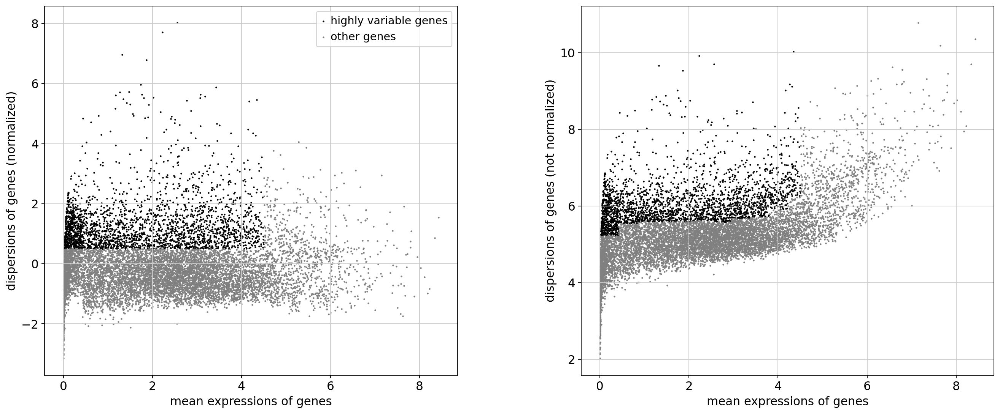

In [73]:
sc.pp.highly_variable_genes(alpha_half_of_cells, min_mean=0.0125, max_mean=4.5, min_disp=0.5)

sc.pl.highly_variable_genes(alpha_half_of_cells)


In [74]:
sc.tl.pca(alpha_half_of_cells, svd_solver='arpack', random_state= 353)
sc.pp.neighbors(alpha_half_of_cells, n_neighbors=10, n_pcs=50, random_state= 678)
sc.tl.umap(alpha_half_of_cells, random_state= 5678)



In [75]:
alpha_half_of_cells.obs['Meta Cluster String'] =alpha_half_of_cells.obs['Meta Cluster'].astype(str)
beta_half_of_cells.obs['Meta Cluster String'] =beta_half_of_cells.obs['Meta Cluster'].astype(str)
single_cell_arabidopsis_root_4_datasets.obs['Meta Cluster String'] =single_cell_arabidopsis_root_4_datasets.obs['Meta Cluster'].astype(str)

/tmp/ipykernel_1790968/3437262584.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  beta_half_of_cells.obs['Meta Cluster String'] =beta_half_of_cells.obs['Meta Cluster'].astype(str)
/tmp/ipykernel_1790968/3437262584.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  single_cell_arabidopsis_root_4_datasets.obs['Meta Cluster String'] =single_cell_arabidopsis_root_4_datasets.obs['Meta Cluster'].astype(str)


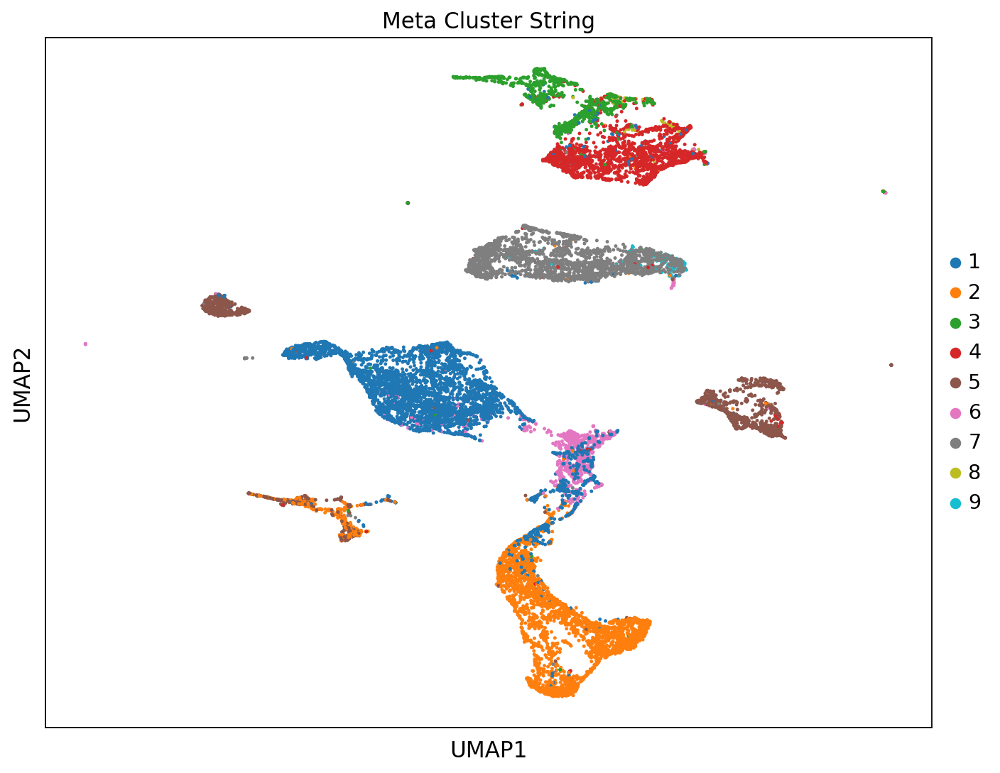

In [76]:
sc.pl.umap(single_cell_arabidopsis_root_4_datasets, color= 'Meta Cluster String', s = 20, palette = 'tab10')

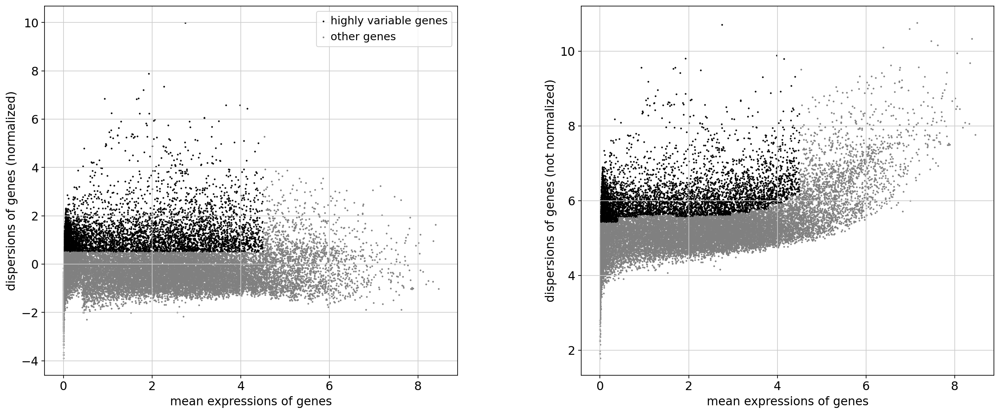

In [77]:
sc.pp.highly_variable_genes(single_cell_arabidopsis_root_4_datasets, min_mean=0.0125, max_mean=4.5, min_disp=0.5)

sc.pl.highly_variable_genes(single_cell_arabidopsis_root_4_datasets)


In [78]:
meta_cluster_ID = {'1':'Atrichoblasts/Columella', '2':'Trichoblasts','3':'Xylem','4':'Phloem 1','5':'Cortex','6':'Mersematic/QC','7':'Endodermis','8':'Phloem 2','9':'Endodermis 2'}

In [79]:
single_cell_arabidopsis_root_4_datasets.obs['Meta Cluster ID'] = single_cell_arabidopsis_root_4_datasets.obs['Meta Cluster String'].map(meta_cluster_ID)
single_cell_arabidopsis_root_4_datasets.obs

,Cell Type,Study Number,Batch Cluster,Meta Cluster,Meta Cluster String,Meta Cluster ID
b'AAACCTGAGAAGGTTT-1',10,1,15,8,8,Phloem 2
b'AAACCTGAGAGTGACC-1',14,1,23,1,1,Atrichoblasts/Columella
b'AAACCTGAGCGATTCT-1',15,1,25,2,2,Trichoblasts
b'AAACCTGAGGCTCATT-1',15,1,25,2,2,Trichoblasts
b'AAACCTGAGGGTGTTG-1',15,1,25,2,2,Trichoblasts
...,...,...,...,...,...,...
b'WT3_WT3_TTTGTCAGTCTGCGGT',8,3,43,7,7,Endodermis
b'WT3_WT3_TTTGTCAGTTCCACTC',12,3,47,5,5,Cortex
b'WT3_WT3_TTTGTCATCCTCCTAG',1,3,41,4,4,Phloem 1
b'WT3_WT3_TTTGTCATCTCGATGA',10,3,45,2,2,Trichoblasts


In [80]:
highly_variable_genes = single_cell_arabidopsis_root_4_datasets.var.loc[single_cell_arabidopsis_root_4_datasets.var['highly_variable'] == True]

In [81]:
highly_variable_maize_map = trimmed_maize_arab_map.loc[trimmed_maize_arab_map['arabidopsis'].isin(highly_variable_genes.index)]
highly_variable_maize_map

,arabidopsis,maize,arabidopsis_OrthoID,maize_OrthoID,Group ID
4,AT1G04030,Zm00001d027589,3702_0:000ec7,4577_0:000005,1
9,AT4G33330,Zm00001d027938,3702_0:004f05,4577_0:000011,6
11,AT4G34970,Zm00001d028392,3702_0:00435e,4577_0:000013,7
19,AT2G02990,Zm00001d032186,3702_0:002504,4577_0:000024,13
24,AT2G14820,Zm00001d033344,3702_0:002415,4577_0:000025,14
...,...,...,...,...,...
37503,AT4G27030,Zm00001d000020,3702_0:004d35,4577_0:0090bd,8098
37512,AT4G14630,Zm00001d000018,3702_0:004a94,4577_0:0090be,2432
37513,AT5G38940,Zm00001d000018,3702_0:005b8f,4577_0:0090be,2432
37568,AT1G13970,Zm00001d000143,3702_0:001b21,4577_0:009103,1036


In [82]:
trimmed_maize_arab_map['Group ID'].value_counts().head(20)

2087    486
2709    105
241      91
521      84
2766     84
534      80
778      78
2432     75
2261     75
767      72
2450     70
496      70
1049     70
1577     68
653      64
3196     60
78       56
3036     56
2598     56
494      55
Name: Group ID, dtype: int64

In [83]:
highly_variable_maize_map['Group ID'].value_counts().head(50)

2766    60
2432    50
2002    40
1049    40
534     40
3109    36
494     35
2450    35
3059    35
1577    32
1979    30
2750    30
511     30
921     27
2087    27
241     26
29      24
2598    24
3697    24
1719    24
898     21
1590    21
4120    20
3196    20
2991    20
4009    20
321     20
3809    20
2369    20
2099    18
1289    18
2842    18
359     18
1969    18
1393    18
681     16
1727    16
316     16
1564    16
746     16
3606    16
3072    16
2054    16
3068    16
3505    15
263     15
1386    15
223     15
3033    15
2261    15
Name: Group ID, dtype: int64

In [84]:
current_group = trimmed_maize_arab_map.loc[trimmed_maize_arab_map['Group ID'] == 3072] ## Possible Examples : 0, 586, 3059, 2690, 3515
#current_group
alpha_rows = []
beta_columns = []
for arab_gene in set(current_group['arabidopsis'].to_list()):
    if arab_gene in alpha_half_of_genes:
        alpha_rows.append(arab_gene)
    if arab_gene in beta_half_of_genes:
        beta_columns.append(arab_gene)
        
subset_dataframe =  arab_cococonet_alpha_half.loc[arab_cococonet_alpha_half.index.isin(alpha_rows)]
subset_dataframe = subset_dataframe[subset_dataframe.columns.intersection(beta_columns)]
subset_dataframe

,AT1G78090,AT5G10100,AT5G65140,AT4G39770
AT1G35910,0.713735,0.637096,0.681951,0.666598
AT2G22190,0.492897,0.472927,0.494119,0.542687


In [85]:
genes_of_interest = ['AT1G16150','AT1G16160','AT4G31100'] ### Best Gene Sets - ['AT4G13340','AT1G62440','AT3G22800'] , ['AT4G13340','AT1G62440','AT4G28380'], ['AT4G11470','AT4G23180','AT4G23290'],['AT1G23080','AT2G01420','AT5G57090']
# Real Best ['AT1G73280','AT1G73300','AT2G23000'], ['AT2G14960','AT1G28130','AT5G13320'], ['AT5G22730','AT3G51530','AT5G22660'], ['AT1G16150','AT1G16160','AT4G31100'],['AT2G25450','AT1G06640','AT1G04380']['AT4G37490','AT3G11520','AT1G34460']['AT5G06730','AT4G08770','AT3G49110']['AT1G44970','AT5G66390','AT4G36430'] ['AT4G10960','AT4G23920','AT1G63180']['AT2G22190','AT4G39770','AT5G10100']
#Ultra best ['AT1G16150','AT1G16160','AT4G31100']['AT5G51990','AT4G25470','AT4G25490']['AT1G72200','AT1G22500','AT2G35000']['AT2G22190','AT4G39770','AT5G10100']
total_gene_df = pd.DataFrame(columns = ['Gene','Expression Level','Cell Type'])
list_of_values_for_line_plot = []

for cell_type in set(single_cell_arabidopsis_root_4_datasets.obs['Meta Cluster ID']):
    current_type_anndata = single_cell_arabidopsis_root_4_datasets[single_cell_arabidopsis_root_4_datasets.obs['Meta Cluster ID'] == cell_type,:]
    current_type_anndata = current_type_anndata[:,current_type_anndata.var_names.isin(genes_of_interest)]

    panda_version_of_current_data = pd.DataFrame(columns = current_type_anndata.var_names, index = current_type_anndata.obs.index, data = current_type_anndata.X)


    ### bar plot Calculator
    # series_of_means = panda_version_of_current_data.mean()
    # list_of_values_for_line_plot.extend(list(zip(series_of_means.index,series_of_means,[cell_type]*len(series_of_means))))


    ## Don't Average and instead get all values for pointplot
    melted_genes = panda_version_of_current_data.melt(var_name = 'Gene',value_name= 'Expression Level')
    melted_genes['Cell Type'] = cell_type
    total_gene_df = pd.concat([total_gene_df,melted_genes])


(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Endodermis'),
  Text(1, 0, 'Phloem 1'),
  Text(2, 0, 'Trichoblasts'),
  Text(3, 0, 'Mersematic/QC'),
  Text(4, 0, 'Cortex'),
  Text(5, 0, 'Phloem 2'),
  Text(6, 0, 'Atrichoblasts/Columella'),
  Text(7, 0, 'Endodermis 2'),
  Text(8, 0, 'Xylem')])

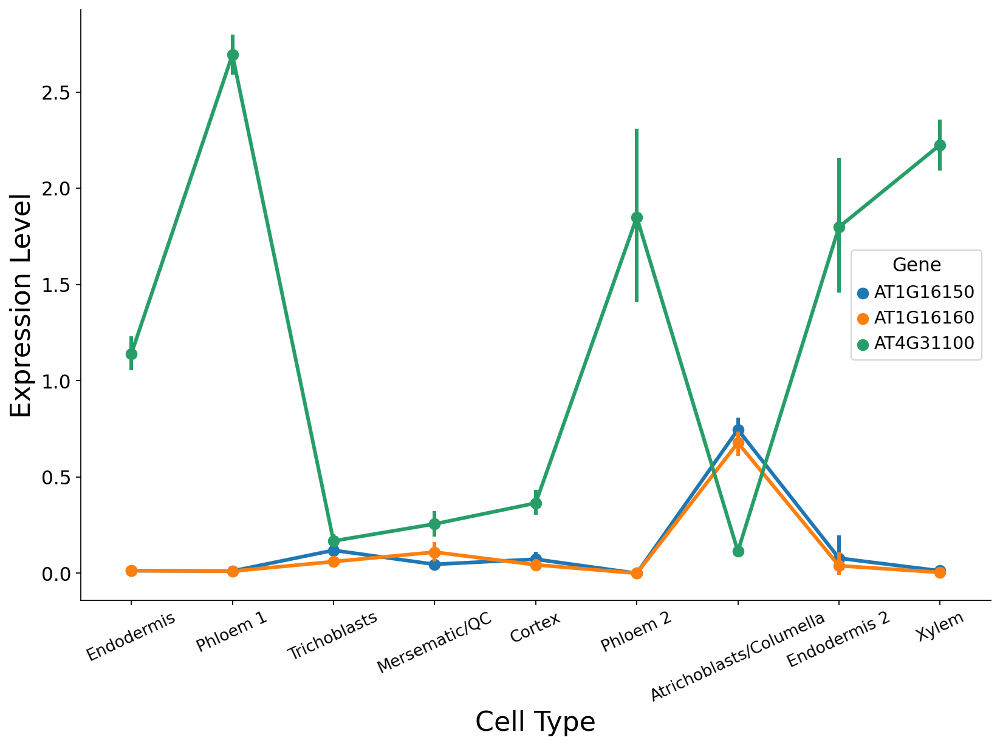

In [86]:
fig, ax = plt.subplots(figsize = (12,8))
fig.patch.set_facecolor('white')
ax = sns.pointplot(data = total_gene_df, x = 'Cell Type',y = 'Expression Level',hue = 'Gene', errorbar= 'se')
plt.ylabel("Expression Level", fontsize = 20)
plt.xlabel("Cell Type", fontsize = 20)
sns.despine()

ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
#plt.xlim((-7,7))
# plt.ylim((0, 1250))
#plt.title("Current Threshold is 31", fontsize = 20)
plt.xticks(fontsize = 12, rotation = 25)
#plt.yticks(fontsize = 11)

In [87]:
cell_type_mapper = {'Phloem 1':1,'Xylem':2,'Endodermis 2':3,'Phloem 2':4,'Endodermis':5,'Atrichoblasts/Columella':6,'Trichoblasts':7,'Mersematic/QC':8,'Cortex':9}

In [88]:
total_gene_df['Cell Type Number'] = total_gene_df['Cell Type'].map(cell_type_mapper)

In [89]:
cell_type_mapper

{'Phloem 1': 1,
 'Xylem': 2,
 'Endodermis 2': 3,
 'Phloem 2': 4,
 'Endodermis': 5,
 'Atrichoblasts/Columella': 6,
 'Trichoblasts': 7,
 'Mersematic/QC': 8,
 'Cortex': 9}

In [90]:
total_gene_df= total_gene_df.reset_index(drop = True)
total_gene_df

,Gene,Expression Level,Cell Type,Cell Type Number
0,AT1G16150,0.0,Endodermis,5
1,AT1G16150,0.0,Endodermis,5
2,AT1G16150,0.0,Endodermis,5
3,AT1G16150,0.0,Endodermis,5
4,AT1G16150,0.0,Endodermis,5
...,...,...,...,...
49900,AT4G31100,0.0,Xylem,2
49901,AT4G31100,0.0,Xylem,2
49902,AT4G31100,0.0,Xylem,2
49903,AT4G31100,4.905965,Xylem,2


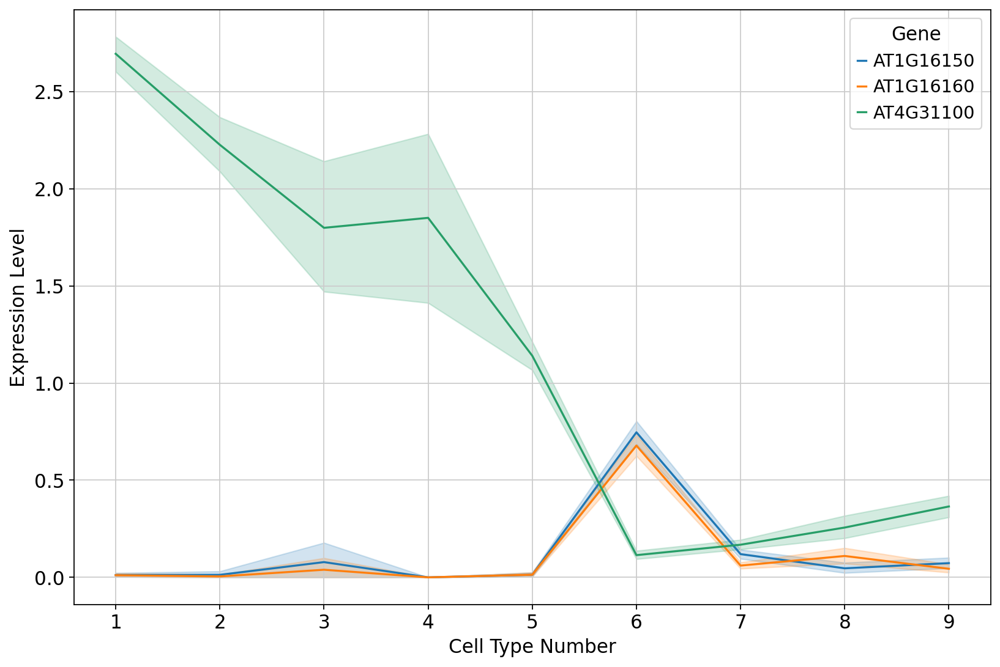

In [91]:
fig, ax = plt.subplots(figsize = (12,8))
fig.patch.set_facecolor('white')
ax = sns.lineplot(data = total_gene_df, x = 'Cell Type Number',y = 'Expression Level',hue = 'Gene', ) #style = 'Gene', dashes = True
# plt.ylabel("Expression Level (log2 CPM)", fontsize = 20)
# plt.xlabel("Cell Type", fontsize = 20)
# # sns.despine()

# ax.grid(False)
# ax.spines["bottom"].set_color("black")
# ax.spines["left"].set_color("black")
# ax.spines["top"].set_color("black")
# ax.spines["right"].set_color("black")
# ax.set_xticks([1,2,3,4,5,6,7,8,9], labels=['Phloem 1','Xylem','Endodermis 2','Phloem 2','Endodermis','Atrichoblasts/Columella','Trichoblasts','Meristematic/QC','Cortex'])
# #ax.set_xticklabels(['Phloem 1','Xylem','Endodermis 2','Phloem 2','Endodermis','Atrichoblasts/Columella','Trichoblasts','Meristematic/QC','Cortex'])
# #plt.xlim((-7,7))
# # plt.ylim((0, 1250))
# #plt.title("Current Threshold is 31", fontsize = 20)
# plt.xticks(fontsize = 12, rotation = 25)
# #plt.yticks(fontsize = 11)
# #plt.savefig('/data/passala/Plots_for_projects/Coexpressolog_paper_plots/Arabidopsis_genes.svg')

(array([1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(1, 0, 'Phloem 1'),
  Text(2, 0, 'Xylem'),
  Text(3, 0, 'Endodermis 2'),
  Text(4, 0, 'Phloem 2'),
  Text(5, 0, 'Endodermis'),
  Text(6, 0, 'Atrichoblasts/Columella'),
  Text(7, 0, 'Trichoblasts'),
  Text(8, 0, 'Meristematic/QC'),
  Text(9, 0, 'Cortex')])

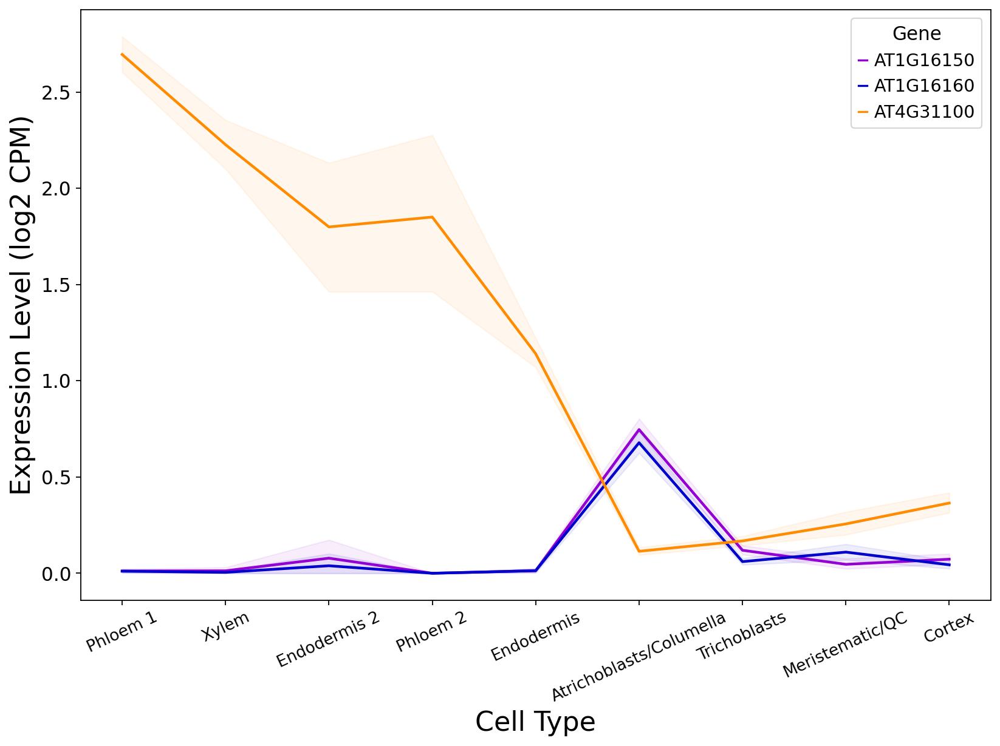

In [92]:
fig, ax = plt.subplots(figsize = (12,8))
fig.patch.set_facecolor('white')
ax = sns.lineplot(data = total_gene_df, x = 'Cell Type Number',y = 'Expression Level',hue = 'Gene', hue_order=['AT1G16150','AT1G16160','AT4G31100'], palette= ['darkviolet','mediumblue','darkorange'],  err_kws= {'alpha':.07,}, linewidth = 2) #style = 'Gene', dashes = True
plt.ylabel("Expression Level (log2 CPM)", fontsize = 20)
plt.xlabel("Cell Type", fontsize = 20)
# sns.despine()

ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
ax.spines["top"].set_color("black")
ax.spines["right"].set_color("black")
ax.set_xticks([1,2,3,4,5,6,7,8,9], labels=['Phloem 1','Xylem','Endodermis 2','Phloem 2','Endodermis','Atrichoblasts/Columella','Trichoblasts','Meristematic/QC','Cortex'])
#ax.set_xticklabels(['Phloem 1','Xylem','Endodermis 2','Phloem 2','Endodermis','Atrichoblasts/Columella','Trichoblasts','Meristematic/QC','Cortex'])
#plt.xlim((-7,7))
# plt.ylim((0, 1250))
#plt.title("Current Threshold is 31", fontsize = 20)
plt.xticks(fontsize = 12, rotation = 25)
#plt.yticks(fontsize = 11)
#plt.savefig('/data/passala/Plots_for_projects/Coexpressolog_paper_plots/Arabidopsis_genes.svg')

test

In [93]:
genes_of_interest = ['AT1G16150','AT1G16160','AT4G31100'] ### Best Gene Sets - ['AT4G13340','AT1G62440','AT3G22800'] , ['AT4G13340','AT1G62440','AT4G28380'], ['AT4G11470','AT4G23180','AT4G23290'],
# Real Best ['AT1G73280','AT1G73300','AT2G23000'], ['AT2G14960','AT1G28130','AT5G13320'], ['AT5G22730','AT3G51530','AT5G22660'], ['AT1G16150','AT1G16160','AT4G31100']
list_of_values_for_line_plot = []
full_cell_list_with_cell_type_for_joy_plot = pd.DataFrame()
for cell_type in set(single_cell_arabidopsis_root_4_datasets.obs['Meta Cluster ID']):
    print(cell_type)
    current_type_anndata = single_cell_arabidopsis_root_4_datasets[single_cell_arabidopsis_root_4_datasets.obs['Meta Cluster ID'] == cell_type,:]
    current_type_anndata = current_type_anndata[:,current_type_anndata.var_names.isin(genes_of_interest)]

    panda_version_of_current_data = pd.DataFrame(columns = current_type_anndata.var_names, index = current_type_anndata.obs.index, data = current_type_anndata.X)
    panda_version_of_current_data['Cell Type'] = cell_type
    full_cell_list_with_cell_type_for_joy_plot = pd.concat([full_cell_list_with_cell_type_for_joy_plot,panda_version_of_current_data])

    ### bar plot Calculator
    # series_of_means = panda_version_of_current_data.mean()
    # list_of_values_for_line_plot.extend(list(zip(series_of_means.index,series_of_means,[cell_type]*len(series_of_means))))


#     ## Don't Average and instead get all values for pointplot
#     melted_genes = panda_version_of_current_data.melt(var_name = 'Gene',value_name= 'Expression Level')
#     melted_genes['Cell Type'] = cell_type
#     total_gene_df = pd.concat([total_gene_df,melted_genes])
# panda_version_of_current_data

Endodermis
Phloem 1
Trichoblasts
Mersematic/QC
Cortex
Phloem 2
Atrichoblasts/Columella
Endodermis 2
Xylem


In [94]:
full_cell_list_with_cell_type_for_joy_plot

,AT1G16150,AT1G16160,AT4G31100,Cell Type
b'AAACCTGGTGTTGAGG-1',0.0,0.0,4.719050,Endodermis
b'AAACGGGGTTAAAGAC-1',0.0,0.0,4.924710,Endodermis
b'AAACGGGTCAGAGCTT-1',0.0,0.0,0.000000,Endodermis
b'AAAGATGTCGGTGTTA-1',0.0,0.0,0.000000,Endodermis
b'AAAGCAAGTTCATGGT-1',0.0,0.0,4.902179,Endodermis
...,...,...,...,...
b'WT3_WT3_TTCGAAGTCTCCCTGA',0.0,0.0,0.000000,Xylem
b'WT3_WT3_TTCGGTCAGCGCCTCA',0.0,0.0,0.000000,Xylem
b'WT3_WT3_TTCTTAGGTCCGTTAA',0.0,0.0,0.000000,Xylem
b'WT3_WT3_TTGCGTCCAAACTGCT',0.0,0.0,4.905965,Xylem


In [95]:
#import joypy
#fig, axes = joypy.joyplot(full_cell_list_with_cell_type_for_joy_plot, by = 'Cell Type', ylim = 'own', legend = True, fill = False, kind = 'kde')

In [96]:
#genes_of_interest = ['AT1G16150','AT1G16160','AT4G31100'] ### Best Gene Sets - ['AT4G13340','AT1G62440','AT3G22800'] , ['AT4G13340','AT1G62440','AT4G28380'], ['AT4G11470','AT4G23180','AT4G23290'],['AT1G44970','AT5G66390','AT4G36430']['AT1G23080','AT2G01420','AT5G57090']
# Real Best ['AT1G73280','AT1G73300','AT2G23000'], ['AT2G14960','AT1G28130','AT5G13320'], ['AT5G22730','AT3G51530','AT5G22660'], ['AT1G16150','AT1G16160','AT4G31100']['AT1G44970','AT5G66390','AT4G36430']['AT1G72200','AT1G22500','AT2G35000']['AT2G22190','AT4G39770','AT5G10100']
target_genes=['AT1G16150',"AT2G14960","AT2G25450",'AT4G25470','AT4G37490','AT5G06730','AT1G44970','AT5G22730','AT4G13340','AT1G72200','AT4G10960','AT1G23080','AT2G22190']
accepted_genes=['AT1G16160','AT1G28130','AT1G06640','AT5G51990','AT3G11520','AT4G08770','AT5G66390','AT3G51530','AT1G62440','AT1G22500','AT4G23920','AT2G01420','AT4G39770']
rejected_genes = ['AT4G31100','AT5G13320','AT1G04380','AT4G25490','AT1G34460','AT3G49110','AT4G36430','AT5G22660','AT4G28380','AT2G35000','AT1G63180','AT5G57090','AT5G10100']


dict_of_good_plotting_examples = {}
current_iteration = 0
for target,accepted,rejected in zip(target_genes,accepted_genes,rejected_genes):
    genes_of_interest = []
    genes_of_interest.append(target)
    genes_of_interest.append(accepted)
    genes_of_interest.append(rejected)
    total_gene_df = pd.DataFrame(columns = ['Gene','Expression Level','Cell Type'])
    for cell_type in set(single_cell_arabidopsis_root_4_datasets.obs['Meta Cluster ID']):
    

        current_type_anndata = single_cell_arabidopsis_root_4_datasets[single_cell_arabidopsis_root_4_datasets.obs['Meta Cluster ID'] == cell_type,:]
        current_type_anndata = current_type_anndata[:,current_type_anndata.var_names.isin(genes_of_interest)]

        panda_version_of_current_data = pd.DataFrame(columns = current_type_anndata.var_names, index = current_type_anndata.obs.index, data = current_type_anndata.X)


    ### bar plot Calculator
    # series_of_means = panda_version_of_current_data.mean()
    # list_of_values_for_line_plot.extend(list(zip(series_of_means.index,series_of_means,[cell_type]*len(series_of_means))))


    ## Don't Average and instead get all values for pointplot
        panda_version_of_current_data = panda_version_of_current_data.rename(columns = {accepted:'Accepted Coexpressolog',rejected:'Rejected Coexpressolog'})
        melted_genes = panda_version_of_current_data.melt(var_name = 'Gene',value_name= 'Expression Level', id_vars= target)
        melted_genes = melted_genes.rename(columns = {target:'Target Gene'})
        melted_genes['Cell Type'] = cell_type
        total_gene_df = pd.concat([total_gene_df,melted_genes])
    total_gene_df = total_gene_df.astype({'Expression Level': 'float'})
    dict_of_good_plotting_examples[current_iteration] = total_gene_df
    current_iteration+=1


In [97]:
dict_of_good_plotting_examples

{0:                         Gene  Expression Level   Cell Type  Target Gene
 0     Accepted Coexpressolog          0.000000  Endodermis          0.0
 1     Accepted Coexpressolog          0.000000  Endodermis          0.0
 2     Accepted Coexpressolog          0.000000  Endodermis          0.0
 3     Accepted Coexpressolog          0.000000  Endodermis          0.0
 4     Accepted Coexpressolog          0.000000  Endodermis          0.0
 ...                      ...               ...         ...          ...
 2023  Rejected Coexpressolog          0.000000       Xylem          0.0
 2024  Rejected Coexpressolog          0.000000       Xylem          0.0
 2025  Rejected Coexpressolog          0.000000       Xylem          0.0
 2026  Rejected Coexpressolog          4.905965       Xylem          0.0
 2027  Rejected Coexpressolog          5.829685       Xylem          0.0
 
 [33270 rows x 4 columns],
 1:                         Gene  Expression Level   Cell Type  Target Gene
 0     Accepted 

In [98]:
#dict_of_good_plotting_examples[3] = dict_of_good_plotting_examples[3].astype({'Expression Level': 'float'})

In [99]:
dict_of_good_plotting_examples[3]['Expression Level']

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
2023    0.0
2024    0.0
2025    0.0
2026    0.0
2027    0.0
Name: Expression Level, Length: 33270, dtype: float64

In [100]:
dict_of_good_plotting_examples[3].groupby(['Gene','Cell Type']).mean()

Expression Level  Target Gene
Gene                   Cell Type                                             
Accepted Coexpressolog Atrichoblasts/Columella          0.181624     0.340331
                       Cortex                           0.407742     0.590711
                       Endodermis                       0.625529     0.848235
                       Endodermis 2                     1.863217     1.957808
                       Mersematic/QC                    1.195953     1.350220
                       Phloem 1                         0.667114     0.772890
                       Phloem 2                         0.358583     0.613266
                       Trichoblasts                     0.306900     0.643338
                       Xylem                            0.604106     1.239567
Rejected Coexpressolog Atrichoblasts/Columella          0.287545     0.340331
                       Cortex                           0.165818     0.590711
                       Endodermis                       0.266844     0.848235
                       Endodermis 2                     0.877504     1.957808
                       Mersematic/QC                    1.609201     1.350220
                       Phloem 1                         0.589925     0.772890
                       Phloem 2                         0.335539     0.613266
                       Trichoblasts                     0.110076     0.643338
                       Xylem                            0.856675     1.239567

In [101]:
dict_of_good_plotting_examples[3].groupby(['Gene','Cell Type']).mean()+.000001

Expression Level  Target Gene
Gene                   Cell Type                                             
Accepted Coexpressolog Atrichoblasts/Columella          0.181625     0.340332
                       Cortex                           0.407743     0.590712
                       Endodermis                       0.625530     0.848236
                       Endodermis 2                     1.863218     1.957809
                       Mersematic/QC                    1.195954     1.350221
                       Phloem 1                         0.667115     0.772891
                       Phloem 2                         0.358584     0.613267
                       Trichoblasts                     0.306901     0.643339
                       Xylem                            0.604107     1.239568
Rejected Coexpressolog Atrichoblasts/Columella          0.287546     0.340332
                       Cortex                           0.165819     0.590712
                       Endodermis                       0.266845     0.848236
                       Endodermis 2                     0.877505     1.957809
                       Mersematic/QC                    1.609202     1.350221
                       Phloem 1                         0.589926     0.772891
                       Phloem 2                         0.335540     0.613267
                       Trichoblasts                     0.110077     0.643339
                       Xylem                            0.856676     1.239568

In [102]:
full_distance_plotter = pd.DataFrame()
for key in dict_of_good_plotting_examples.keys():
    current_plotter = dict_of_good_plotting_examples[key].groupby(['Gene','Cell Type']).mean()+.01
    full_distance_plotter = pd.concat([full_distance_plotter,current_plotter])

In [103]:
full_distance_plotter

Expression Level  Target Gene
Gene                   Cell Type                                             
Accepted Coexpressolog Atrichoblasts/Columella          0.688174     0.756476
                       Cortex                           0.053946     0.083105
                       Endodermis                       0.023477     0.023376
                       Endodermis 2                     0.049071     0.088392
                       Mersematic/QC                    0.119948     0.056463
...                                                          ...          ...
Rejected Coexpressolog Mersematic/QC                    0.225113     0.018523
                       Phloem 1                         0.852456     0.249768
                       Phloem 2                         0.119825     0.010000
                       Trichoblasts                     0.104159     0.029909
                       Xylem                            0.491199     0.043748

[234 rows x 2 columns]

In [104]:
full_distance_plotter = full_distance_plotter[['Target Gene','Expression Level']]

In [105]:
full_distance_plotter = full_distance_plotter.reset_index()

In [106]:
p1 = np.array([0,0])
p2 = np.array([40,40])
p3 = np.asarray(full_distance_plotter[['Target Gene','Expression Level']])
distance_from_identity_line=np.cross(p2-p1,p3-p1)/np.linalg.norm(p2-p1)

In [107]:
full_distance_plotter['Euclidian Distance From Equal Expression'] = abs(distance_from_identity_line)

In [108]:
full_distance_plotter['Euclidian Distance From Equal Expression'] = full_distance_plotter['Euclidian Distance From Equal Expression']+.1

In [109]:
full_distance_plotter

,Gene,Cell Type,Target Gene,Expression Level,Euclidian Distance From Equal Expression
0,Accepted Coexpressolog,Atrichoblasts/Columella,0.756476,0.688174,0.148297
1,Accepted Coexpressolog,Cortex,0.083105,0.053946,0.120618
2,Accepted Coexpressolog,Endodermis,0.023376,0.023477,0.100071
3,Accepted Coexpressolog,Endodermis 2,0.088392,0.049071,0.127804
4,Accepted Coexpressolog,Mersematic/QC,0.056463,0.119948,0.144890
...,...,...,...,...,...
229,Rejected Coexpressolog,Mersematic/QC,0.018523,0.225113,0.246082
230,Rejected Coexpressolog,Phloem 1,0.249768,0.852456,0.526165
231,Rejected Coexpressolog,Phloem 2,0.010000,0.119825,0.177658
232,Rejected Coexpressolog,Trichoblasts,0.029909,0.104159,0.152503


<AxesSubplot:>

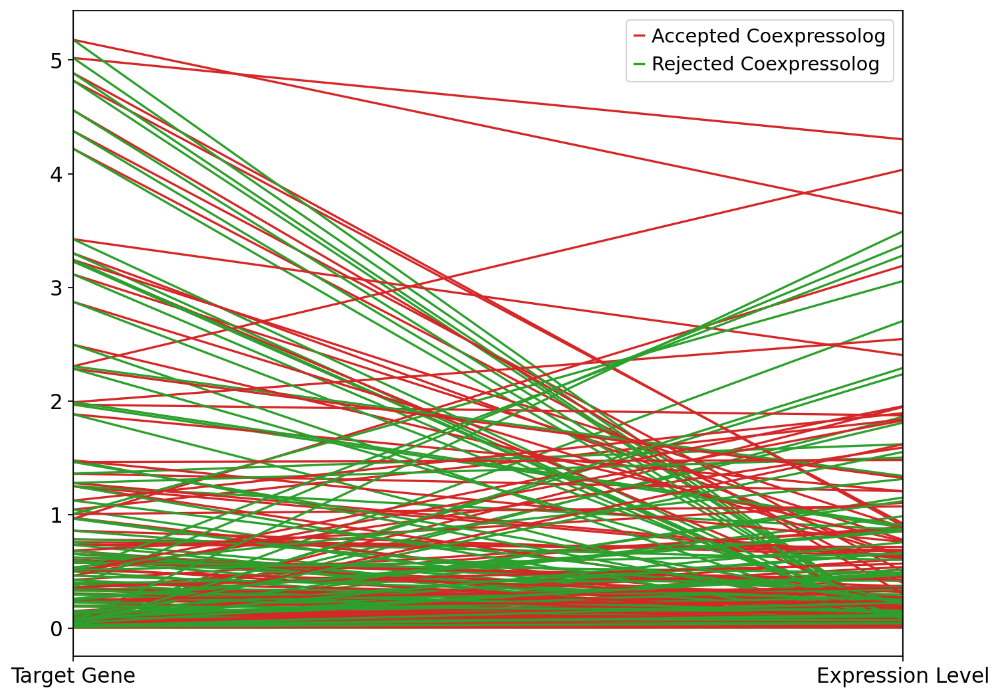

In [110]:
pd.plotting.parallel_coordinates(full_distance_plotter,'Gene', cols = ['Target Gene','Expression Level'], color = ['tab:red','tab:green'])

In [111]:
len(full_distance_plotter['Target Gene'].unique())

111

In [112]:
full_distance_plotter['Quintile'] = pd.qcut(x = full_distance_plotter['Target Gene'], q = 4, labels = [1,2,3,4] )

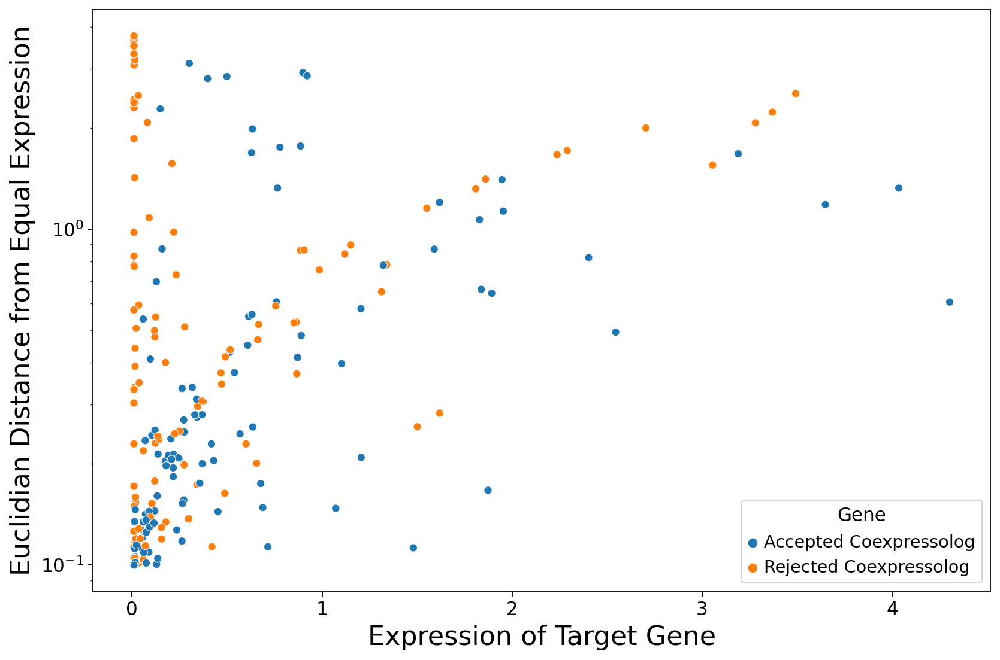

In [113]:
fig, ax = plt.subplots(figsize = (12,8))
fig.patch.set_facecolor('white')
ax = sns.scatterplot(data = full_distance_plotter, x = 'Expression Level', y = 'Euclidian Distance From Equal Expression', hue = 'Gene',)
plt.ylabel("Euclidian Distance from Equal Expression", fontsize = 20)
plt.xlabel("Expression of Target Gene", fontsize = 20)
#sns.despine()
ax.set(yscale = 'log')
ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
ax.spines["top"].set_color("black")
ax.spines["right"].set_color("black")
#ax.set_xscale('log')
#plt.xlim((-7,7))
# plt.ylim((0, 1250))
#plt.title("Current Threshold is 31", fontsize = 20)
#plt.xticks(fontsize = 11, ticks = [0,10,20,30,40,50])
#plt.yticks(fontsize = 11)
#plt.savefig('/data/passala/Plots_for_projects/Coexpressolog_paper_plots/dist_of_euclidean_distance.svg')

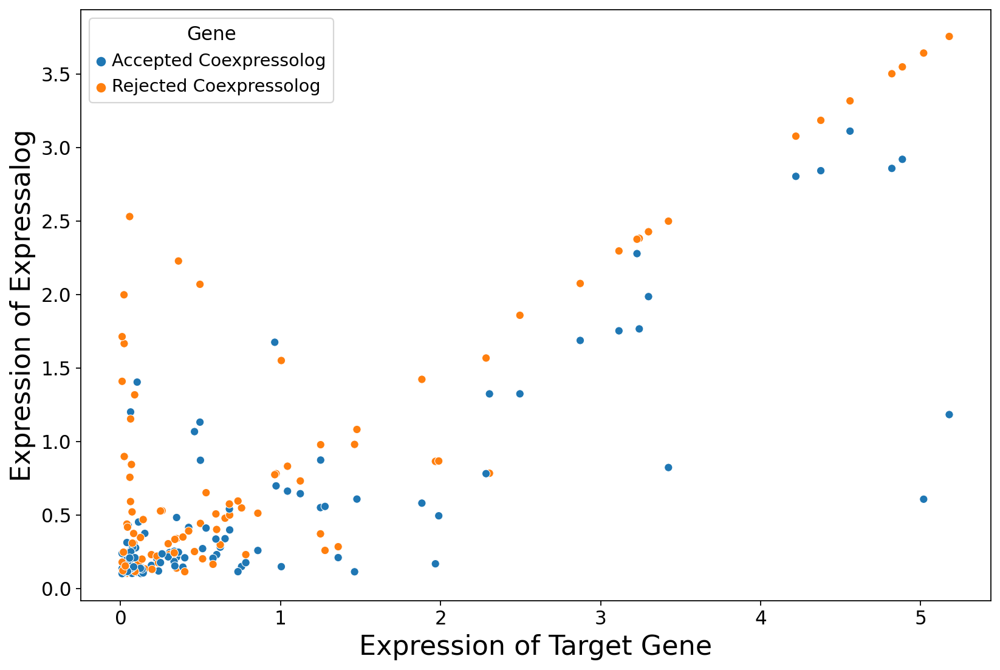

In [114]:
fig, ax = plt.subplots(figsize = (12,8))
fig.patch.set_facecolor('white')
ax = sns.scatterplot(data = full_distance_plotter, x = 'Target Gene', y = 'Euclidian Distance From Equal Expression', hue = 'Gene',)
plt.ylabel("Expression of Expressalog", fontsize = 20)
plt.xlabel("Expression of Target Gene", fontsize = 20)
#sns.despine()

ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
ax.spines["top"].set_color("black")
ax.spines["right"].set_color("black")
#ax.set_xscale('log')
#plt.xlim((-7,7))
# plt.ylim((0, 1250))
#plt.title("Current Threshold is 31", fontsize = 20)
#plt.xticks(fontsize = 11, ticks = [0,10,20,30,40,50])
#plt.yticks(fontsize = 11)
#plt.savefig('/data/passala/Plots_for_projects/Coexpressolog_paper_plots/dist_of_euclidean_distance.svg')

/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 33.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


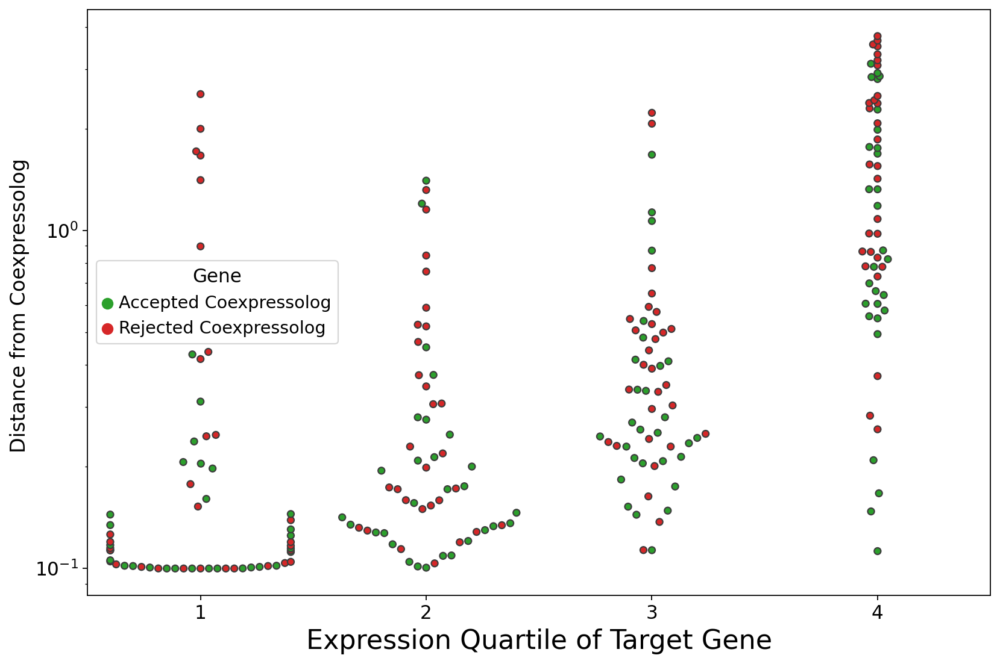

In [115]:
fig, ax = plt.subplots(figsize = (12,8))
fig.patch.set_facecolor('white')
ax = sns.swarmplot(data = full_distance_plotter, x = 'Quintile', y = 'Euclidian Distance From Equal Expression', hue = 'Gene', palette = ['tab:green','tab:red'], linewidth= 1)
plt.ylabel("Distance from Coexpressolog ", fontsize = 15)
plt.xlabel("Expression Quartile of Target Gene", fontsize = 20)
#sns.despine()
ax.set(yscale = 'log')
ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
ax.spines["top"].set_color("black")
ax.spines["right"].set_color("black")
#ax.set_xscale('log')
#plt.xlim((-7,7))
# plt.ylim((0, 1250))
#plt.title("Current Threshold is 31", fontsize = 20)
#plt.xticks(fontsize = 11, ticks = [0,10,20,30,40,50])
#plt.yticks(fontsize = 11)
#plt.savefig('/data/passala/Plots_for_projects/Coexpressolog_paper_plots/euclidian_distance_boxplot.svg')

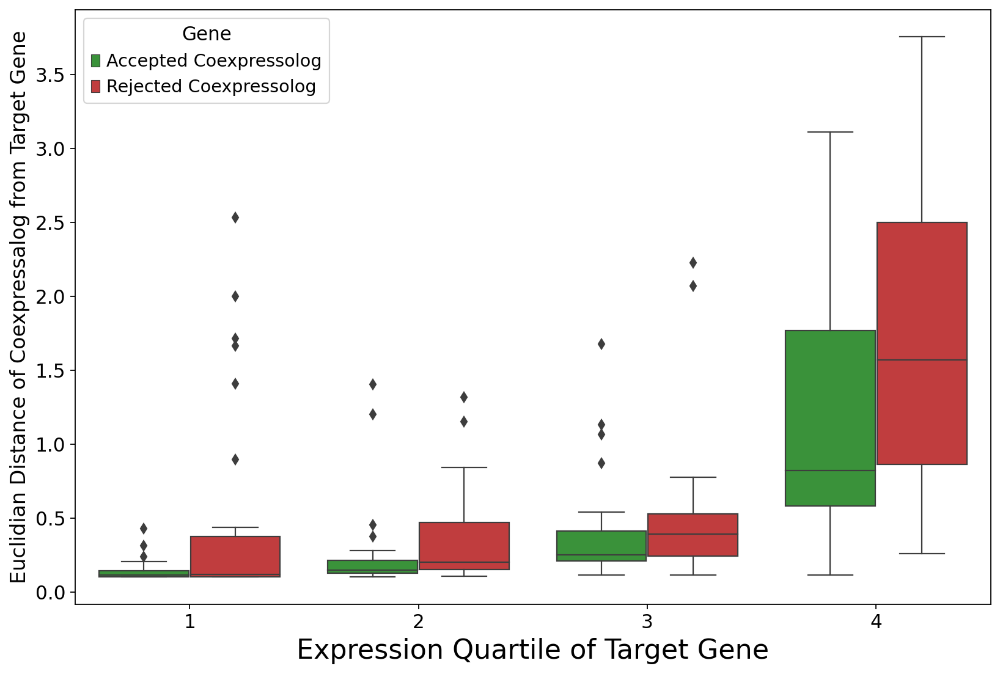

In [116]:
fig, ax = plt.subplots(figsize = (12,8))
fig.patch.set_facecolor('white')
ax = sns.boxplot(data = full_distance_plotter, x = 'Quintile', y = 'Euclidian Distance From Equal Expression', hue = 'Gene', palette = ['tab:green','tab:red'], linewidth= 1)
plt.ylabel("Euclidian Distance of Coexpressalog from Target Gene", fontsize = 15)
plt.xlabel("Expression Quartile of Target Gene", fontsize = 20)
#sns.despine()

ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
ax.spines["top"].set_color("black")
ax.spines["right"].set_color("black")
#ax.set_xscale('log')
#plt.xlim((-7,7))
# plt.ylim((0, 1250))
#plt.title("Current Threshold is 31", fontsize = 20)
#plt.xticks(fontsize = 11, ticks = [0,10,20,30,40,50])
#plt.yticks(fontsize = 11)
#plt.savefig('/data/passala/Plots_for_projects/Coexpressolog_paper_plots/euclidian_distance_boxplot.svg')

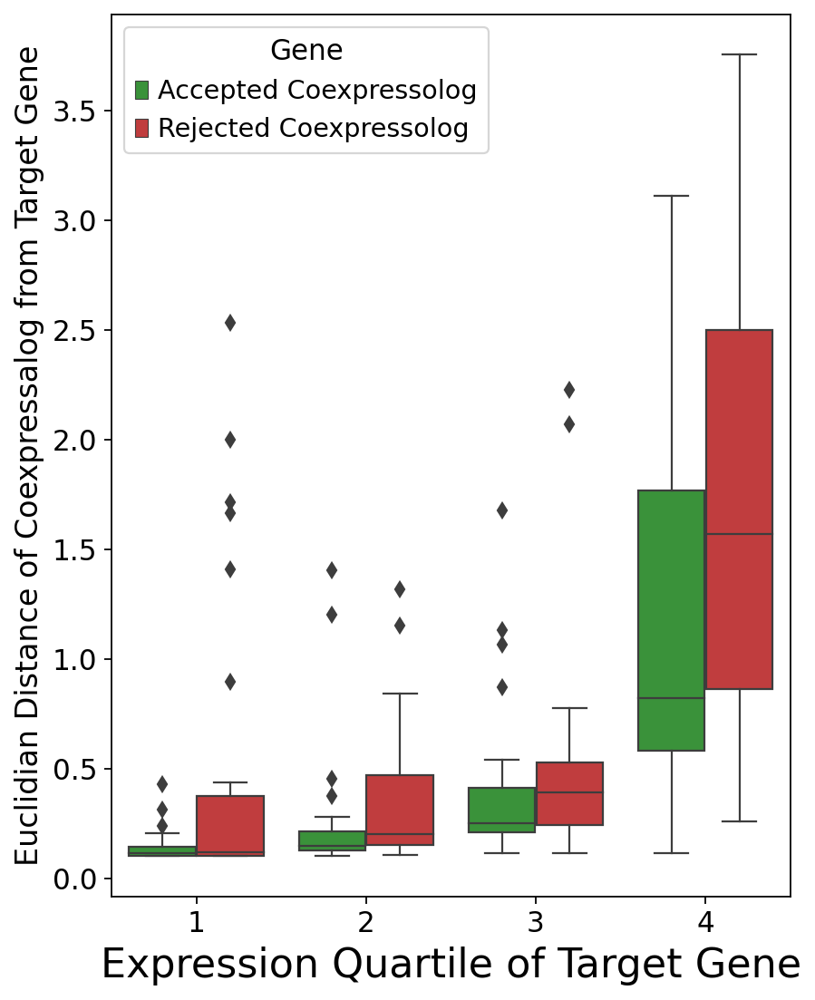

In [117]:
fig, ax = plt.subplots(figsize = (6,8))
fig.patch.set_facecolor('white')
ax = sns.boxplot(data = full_distance_plotter, x = 'Quintile', y = 'Euclidian Distance From Equal Expression', hue = 'Gene', palette = ['tab:green','tab:red'], linewidth= 1)
plt.ylabel("Euclidian Distance of Coexpressalog from Target Gene", fontsize = 15)
plt.xlabel("Expression Quartile of Target Gene", fontsize = 20)
#sns.despine()

ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
ax.spines["top"].set_color("black")
ax.spines["right"].set_color("black")
#ax.set_xscale('log')
#plt.xlim((-7,7))
# plt.ylim((0, 1250))
#plt.title("Current Threshold is 31", fontsize = 20)
#plt.xticks(fontsize = 11, ticks = [0,10,20,30,40,50])
#plt.yticks(fontsize = 11)
#plt.savefig('/data/passala/Plots_for_projects/Coexpressolog_paper_plots/thinner_euclidian_distance_boxplot.svg')

In [118]:
full_distance_plotter_updated = full_distance_plotter.replace({'Accepted Coexpressolog':'Accepted Coexpression Proxy','Rejected Coexpressolog':'Rejected Coexpression Proxy'})


In [119]:
new_rc_params = {'text.usetex': False,
"svg.fonttype": 'none'
}
matplotlib.rcParams.update(new_rc_params)

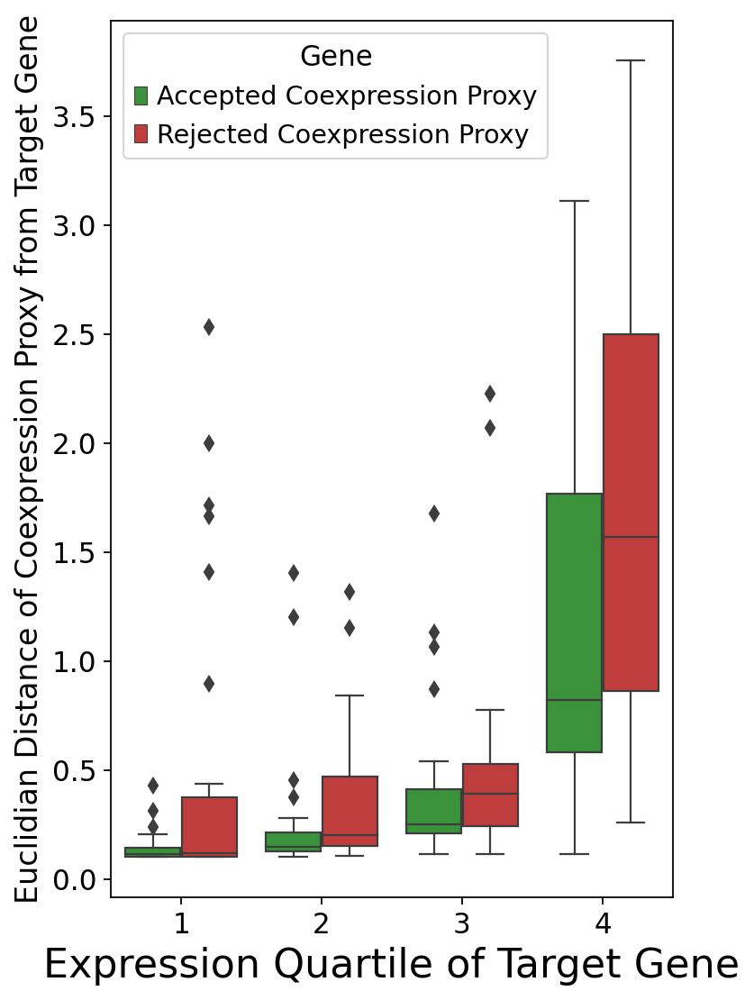

In [120]:
fig, ax = plt.subplots(figsize = (5,8))
fig.patch.set_facecolor('white')
ax = sns.boxplot(data = full_distance_plotter_updated, x = 'Quintile', y = 'Euclidian Distance From Equal Expression', hue = 'Gene', palette = ['tab:green','tab:red'], linewidth= 1)
plt.ylabel("Euclidian Distance of Coexpression Proxy from Target Gene", fontsize = 15)
plt.xlabel("Expression Quartile of Target Gene", fontsize = 20)
#sns.despine()

ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
ax.spines["top"].set_color("black")
ax.spines["right"].set_color("black")
#ax.set_xscale('log')
#plt.xlim((-7,7))
# plt.ylim((0, 1250))
#plt.title("Current Threshold is 31", fontsize = 20)
#plt.xticks(fontsize = 11, ticks = [0,10,20,30,40,50])
#plt.yticks(fontsize = 11)
plt.savefig('/data/passala/Plots_for_projects/Coexpressolog_paper_plots/thinner_updated_euclidian_distance_boxplot.svg')

In [121]:
aligned_mean = full_distance_plotter.groupby(['Gene','Quintile']).mean()

In [122]:
aligned_mean

Target Gene  Expression Level  \
Gene                   Quintile                                  
Accepted Coexpressolog 1            0.026580          0.082276   
                       2            0.117367          0.304101   
                       3            0.523073          0.646232   
                       4            2.668496          1.309486   
Rejected Coexpressolog 1            0.026580          0.528851   
                       2            0.117367          0.400650   
                       3            0.523073          0.458009   
                       4            2.668496          0.386720   

                                 Euclidian Distance From Equal Expression  
Gene                   Quintile                                            
Accepted Coexpressolog 1                                         0.143426  
                       2                                         0.254906  
                       3                                         0.394034  
                       4                                         1.252807  
Rejected Coexpressolog 1                                         0.462152  
                       2                                         0.350083  
                       3                                         0.503850  
                       4                                         1.836981

In [123]:
values = aligned_mean.loc['Accepted Coexpressolog']['Euclidian Distance From Equal Expression'] - aligned_mean.loc['Rejected Coexpressolog']['Euclidian Distance From Equal Expression']
percent_change = abs(values)/aligned_mean.loc['Accepted Coexpressolog']['Euclidian Distance From Equal Expression']

In [124]:
values

Quintile
1   -0.318726
2   -0.095177
3   -0.109816
4   -0.584174
Name: Euclidian Distance From Equal Expression, dtype: float64

In [125]:
percent_change

Quintile
1    2.222233
2    0.373379
3    0.278697
4    0.466292
Name: Euclidian Distance From Equal Expression, dtype: float64

In [126]:
percent_change.mean()

0.8351503736302852

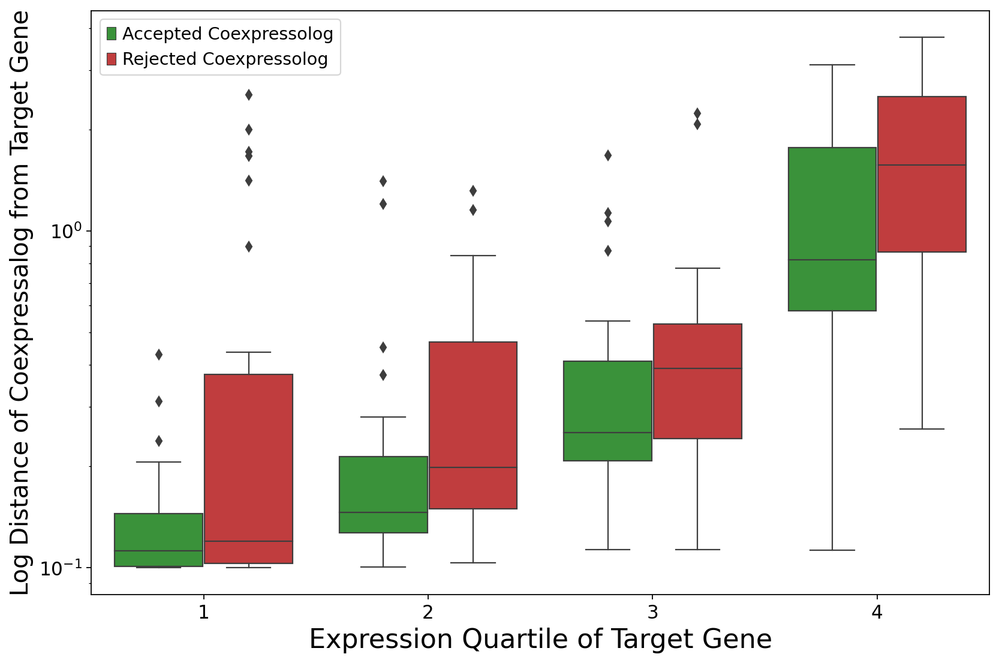

In [127]:
fig, ax = plt.subplots(figsize = (12,8))
fig.patch.set_facecolor('white')
ax = sns.boxplot(data = full_distance_plotter, x = 'Quintile', y = 'Euclidian Distance From Equal Expression', hue = 'Gene', palette = ['tab:green','tab:red'], linewidth= 1)
plt.ylabel("Log Distance of Coexpressalog from Target Gene", fontsize = 18)
plt.xlabel("Expression Quartile of Target Gene", fontsize = 20)
#sns.despine()
ax.set(yscale = 'log')
plt.legend(loc = 'upper left')
ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
ax.spines["top"].set_color("black")
ax.spines["right"].set_color("black")
#ax.set_xscale('log')
#plt.xlim((-7,7))
# plt.ylim((0, 1250))
#plt.title("Current Threshold is 31", fontsize = 20)
#plt.xticks(fontsize = 11, ticks = [0,10,20,30,40,50])
#plt.yticks(fontsize = 11)
plt.savefig('/data/passala/Plots_for_projects/Coexpressolog_paper_plots/euclidian_distance_boxplot_log_scale.svg')

In [128]:
full_distance_plotter['Divided Expression'] = full_distance_plotter['Euclidian Distance From Equal Expression']/full_distance_plotter['Target Gene']
full_distance_plotter

,Gene,Cell Type,Target Gene,Expression Level,Euclidian Distance From Equal Expression,Quintile,Divided Expression
0,Accepted Coexpressolog,Atrichoblasts/Columella,0.756476,0.688174,0.148297,3,0.196037
1,Accepted Coexpressolog,Cortex,0.083105,0.053946,0.120618,2,1.451396
2,Accepted Coexpressolog,Endodermis,0.023376,0.023477,0.100071,1,4.280882
3,Accepted Coexpressolog,Endodermis 2,0.088392,0.049071,0.127804,2,1.445878
4,Accepted Coexpressolog,Mersematic/QC,0.056463,0.119948,0.144890,1,2.566098
...,...,...,...,...,...,...,...
229,Rejected Coexpressolog,Mersematic/QC,0.018523,0.225113,0.246082,1,13.285394
230,Rejected Coexpressolog,Phloem 1,0.249768,0.852456,0.526165,2,2.106613
231,Rejected Coexpressolog,Phloem 2,0.010000,0.119825,0.177658,1,17.765786
232,Rejected Coexpressolog,Trichoblasts,0.029909,0.104159,0.152503,1,5.098941


/tmp/ipykernel_1790968/3802055351.py:8: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim((0,20))


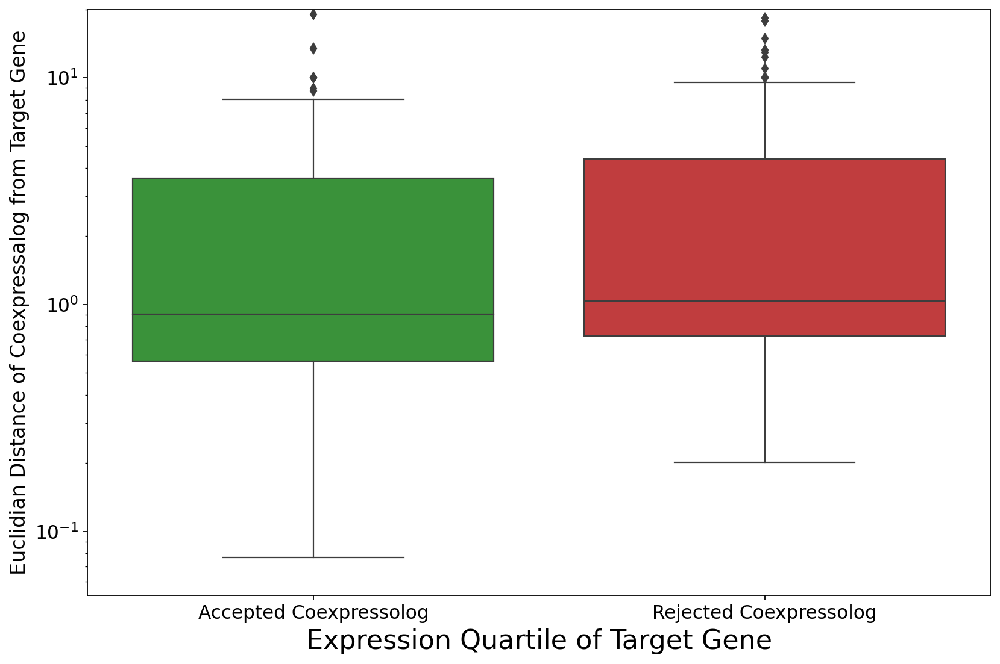

In [129]:
fig, ax = plt.subplots(figsize = (12,8))
fig.patch.set_facecolor('white')
ax = sns.boxplot(data = full_distance_plotter, x = 'Gene', y = 'Divided Expression', palette = ['tab:green','tab:red'], linewidth= 1)
plt.ylabel("Euclidian Distance of Coexpressalog from Target Gene", fontsize = 15)
plt.xlabel("Expression Quartile of Target Gene", fontsize = 20)
#sns.despine()
ax.set(yscale = 'log')
plt.ylim((0,20))
ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
ax.spines["top"].set_color("black")
ax.spines["right"].set_color("black")
#ax.set_xscale('log')

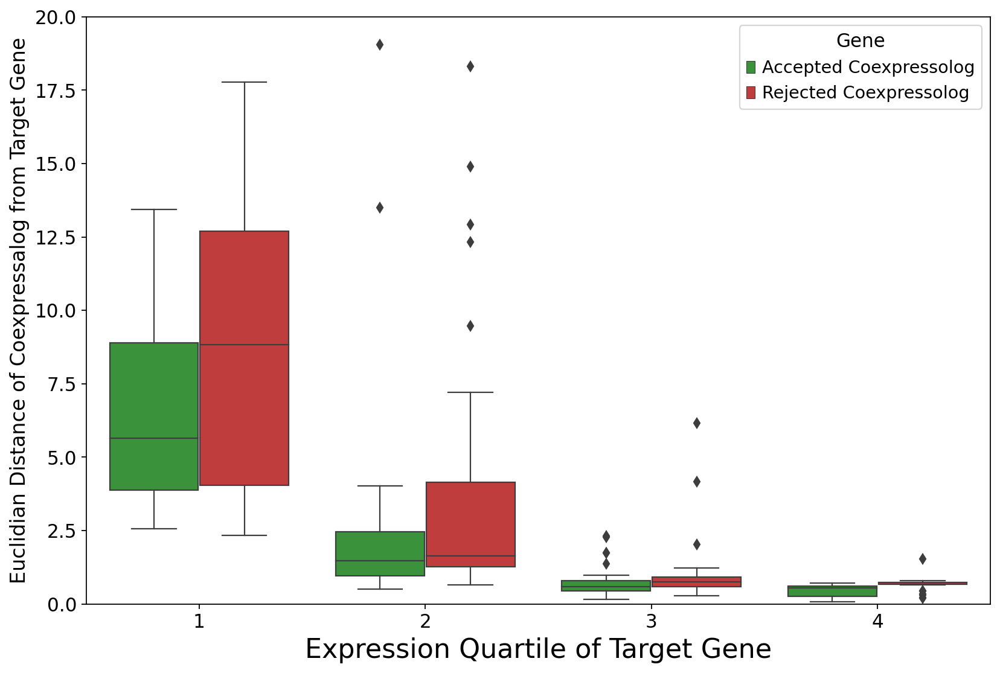

In [130]:
fig, ax = plt.subplots(figsize = (12,8))
fig.patch.set_facecolor('white')
ax = sns.boxplot(data = full_distance_plotter, x = 'Quintile', y = 'Divided Expression', hue = 'Gene', palette = ['tab:green','tab:red'], linewidth= 1)
plt.ylabel("Euclidian Distance of Coexpressalog from Target Gene", fontsize = 15)
plt.xlabel("Expression Quartile of Target Gene", fontsize = 20)
#sns.despine()
plt.ylim((0,20))
ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
ax.spines["top"].set_color("black")
ax.spines["right"].set_color("black")
#ax.set_xscale('log')

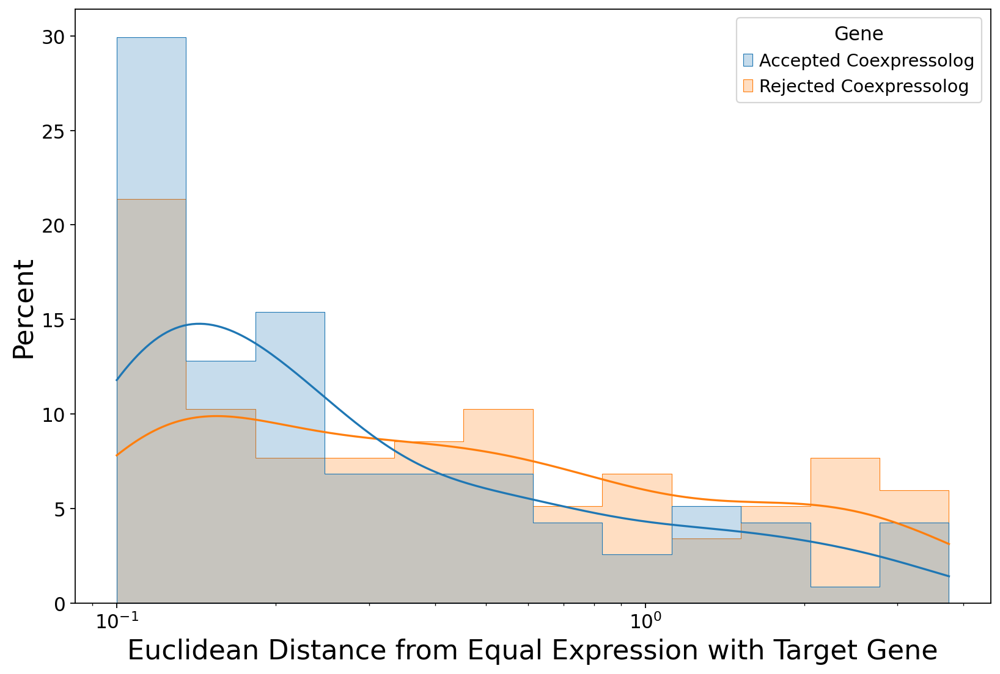

In [131]:
fig, ax = plt.subplots(figsize = (12,8))
fig.patch.set_facecolor('white')
ax = sns.histplot(data = full_distance_plotter, x = 'Euclidian Distance From Equal Expression', hue = 'Gene', bins = 12,  element = 'step', stat = 'percent',common_norm= False,log_scale = True,  kde=True, linewidth = .5, )
plt.ylabel("Percent", fontsize = 20)
plt.xlabel("Euclidean Distance from Equal Expression with Target Gene", fontsize = 20)
#sns.despine()

ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
ax.spines["top"].set_color("black")
ax.spines["right"].set_color("black")
#ax.set_xscale('log')
#plt.xlim((-7,7))
# plt.ylim((0, 1250))
#plt.title("Current Threshold is 31", fontsize = 20)
#plt.xticks(fontsize = 11, ticks = [0,10,20,30,40,50])
#plt.yticks(fontsize = 11)
#plt.savefig('/data/passala/Plots_for_projects/Coexpressolog_paper_plots/dist_of_euclidean_distance.svg')

/tmp/ipykernel_1790968/1258688357.py:13: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  plt.xlim((0,3))
/tmp/ipykernel_1790968/1258688357.py:14: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim((0, 3))


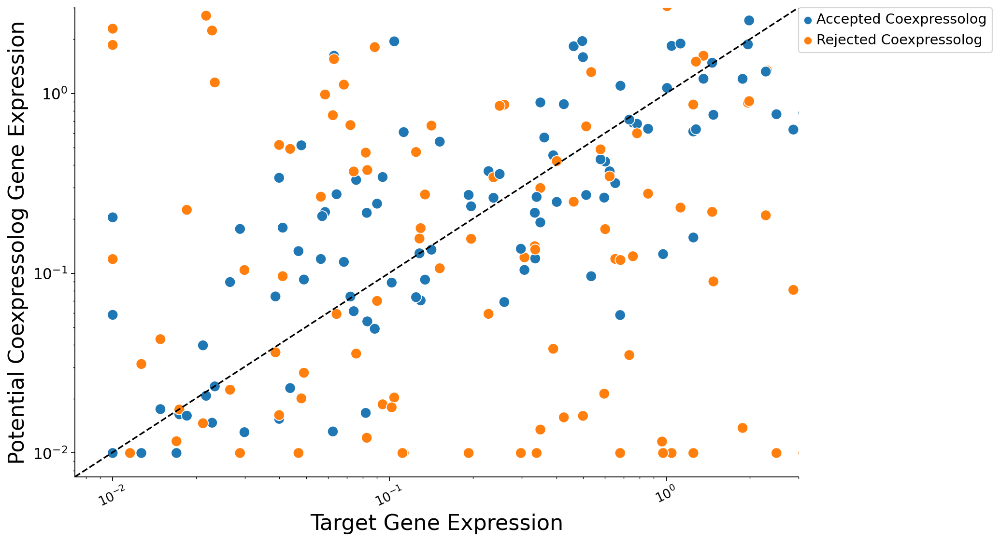

In [132]:
fig, ax = plt.subplots(figsize = (12,8))
fig.patch.set_facecolor('white')
for key in dict_of_good_plotting_examples.keys():
    current_plotter = dict_of_good_plotting_examples[key].groupby(['Gene','Cell Type']).mean()+.01
    sns.scatterplot(data = current_plotter, x = 'Target Gene',y = 'Expression Level',hue = 'Gene', s = 100)
plt.xlabel("Target Gene Expression", fontsize = 20)
plt.ylabel("Potential Coexpressolog Gene Expression", fontsize = 20)
sns.despine()
ax.set(xscale = 'log',yscale = 'log')
ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
plt.xlim((0,3))
plt.ylim((0, 3))
handles, labels  =  ax.get_legend_handles_labels()
ax.legend(handles, ['Accepted Coexpressolog', 'Rejected Coexpressolog'], bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0,)
#plt.title("Current Threshold is 31", fontsize = 20)
plt.xticks(fontsize = 12, rotation = 25)
#plt.yticks(fontsize = 11)
ax.plot([0,1],[0,1], transform=ax.transAxes, linestyle = 'dashed', color = 'k', linewidth = 1.5)

/tmp/ipykernel_1790968/1287258657.py:11: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  plt.xlim((0,3))
/tmp/ipykernel_1790968/1287258657.py:12: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim((0, 3))


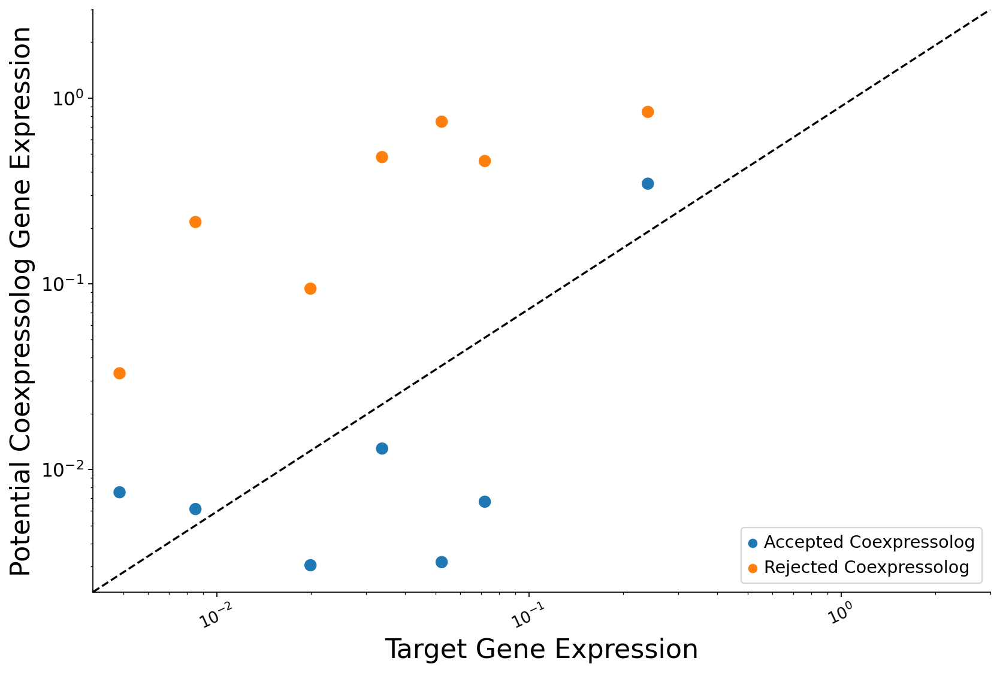

In [133]:
fig, ax = plt.subplots(figsize = (12,8))
fig.patch.set_facecolor('white')
sns.scatterplot(data = total_gene_df.groupby(['Gene','Cell Type']).mean(), x = 'Target Gene',y = 'Expression Level',hue = 'Gene', s = 100)
plt.xlabel("Target Gene Expression", fontsize = 20)
plt.ylabel("Potential Coexpressolog Gene Expression", fontsize = 20)
sns.despine()
ax.set(xscale = 'log',yscale = 'log')
ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")
plt.xlim((0,3))
plt.ylim((0, 3))
handles, labels  =  ax.get_legend_handles_labels()
ax.legend(handles, ['Accepted Coexpressolog', 'Rejected Coexpressolog'], loc='lower right')
#plt.title("Current Threshold is 31", fontsize = 20)
plt.xticks(fontsize = 12, rotation = 25)
#plt.yticks(fontsize = 11)
ax.plot([0,1],[0,1], transform=ax.transAxes, linestyle = 'dashed', color = 'k', linewidth = 1.5)

In [134]:
bar_plot_df = pd.DataFrame(data = list_of_values_for_line_plot, columns = ['Gene','Expression Level','Cell Type'])
bar_plot_df

,Gene,Expression Level,Cell Type


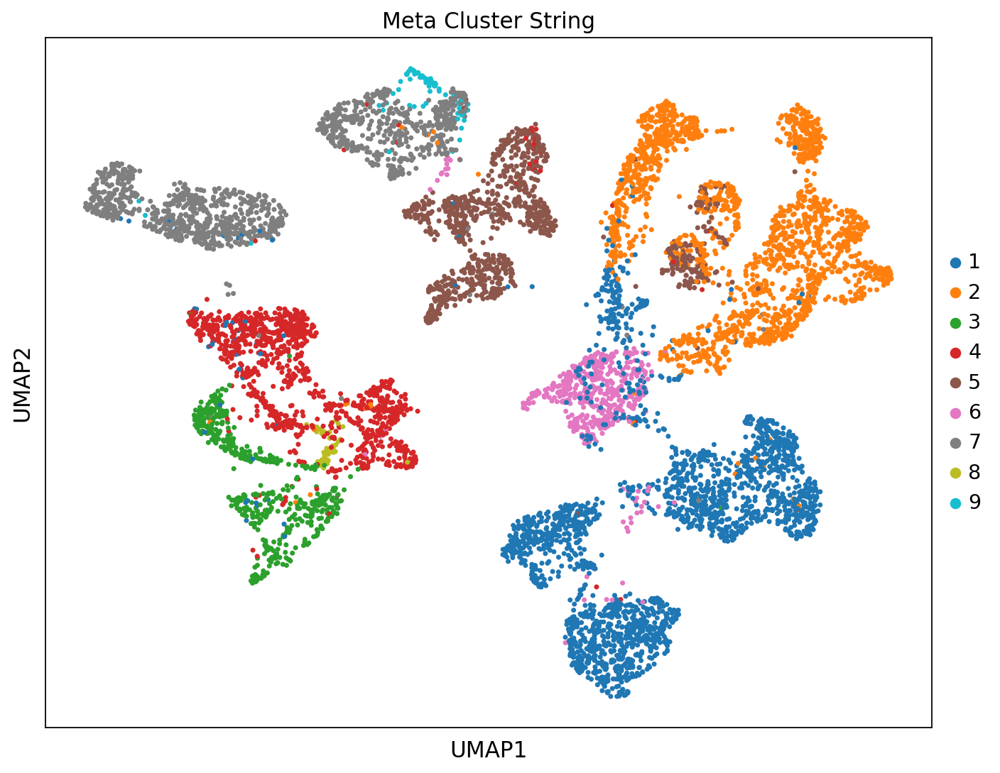

In [135]:
sc.pl.umap(alpha_half_of_cells, color= 'Meta Cluster String', s = 40, palette = 'tab10')

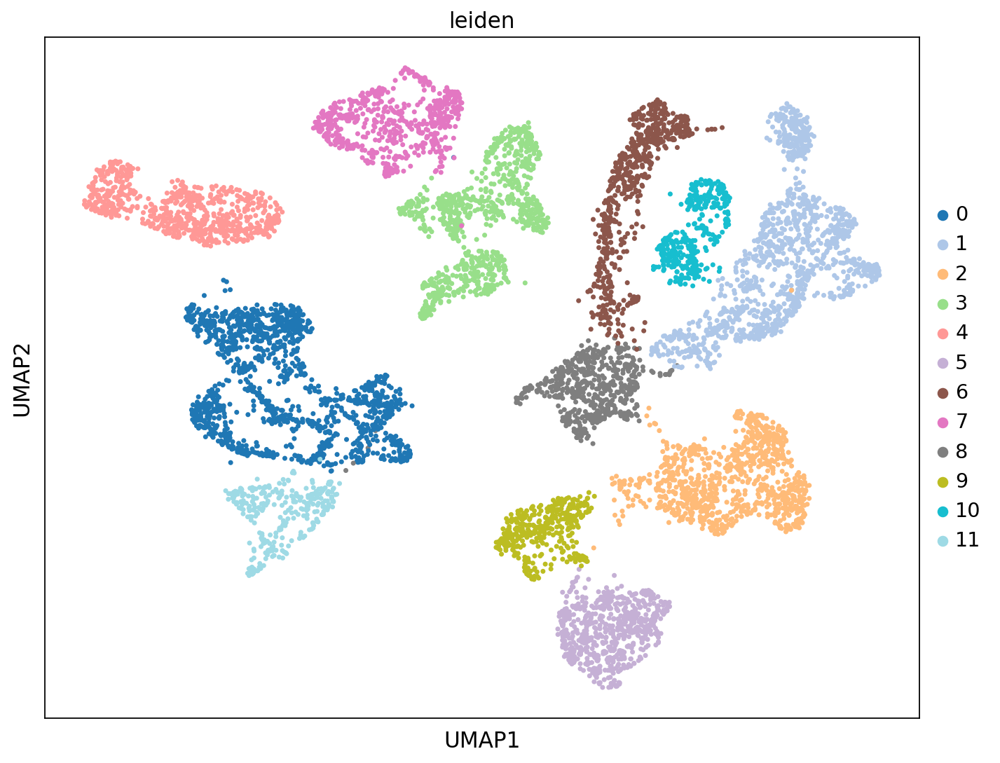

In [136]:
sc.tl.leiden(alpha_half_of_cells, random_state= 112, resolution=.1)

sc.pl.umap(alpha_half_of_cells, color= 'leiden', s = 40, palette = 'tab20')

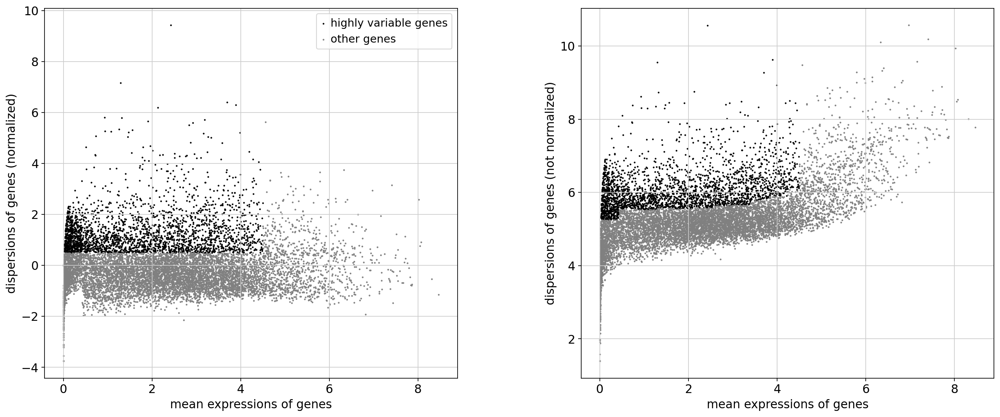

In [137]:
sc.pp.highly_variable_genes(beta_half_of_cells, min_mean=0.0125, max_mean=4.5, min_disp=0.5)

sc.pl.highly_variable_genes(beta_half_of_cells)

In [138]:
sc.tl.pca(beta_half_of_cells, svd_solver='arpack', random_state= 303)
sc.pp.neighbors(beta_half_of_cells, n_neighbors=10, n_pcs=50, random_state= 32)
sc.tl.umap(beta_half_of_cells, random_state= 398)

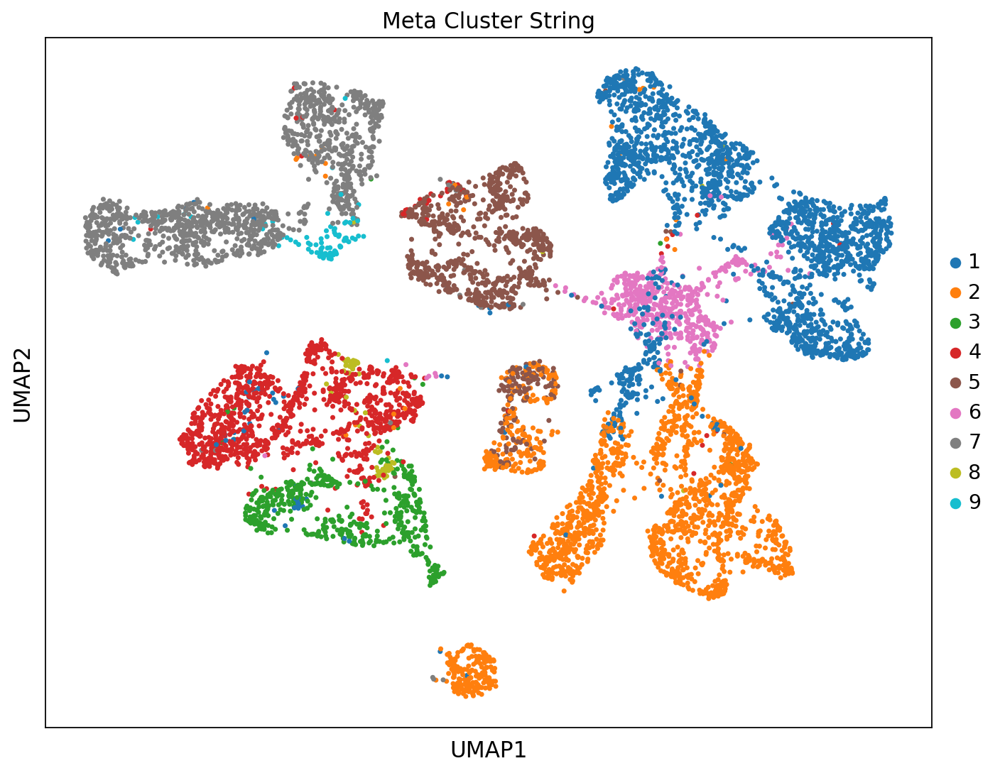

In [139]:
sc.pl.umap(beta_half_of_cells, color= 'Meta Cluster String', s = 40, palette = 'tab10')

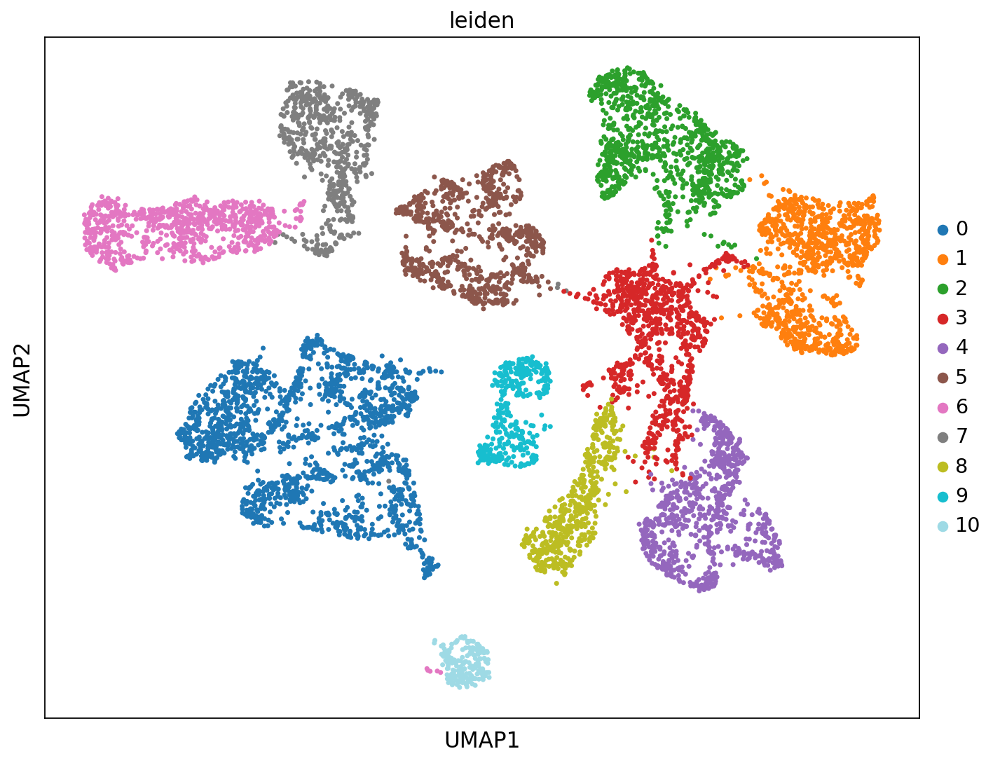

In [140]:
sc.tl.leiden(beta_half_of_cells, resolution= .1, random_state= 404 )

sc.pl.umap(beta_half_of_cells, color= 'leiden', s = 40, palette= 'tab20')

In [141]:
true_pair_dataframe

,Alpha Gene,Beta Gene
0,AT1G04030,AT5G44040
1,AT4G02500,AT3G62720
2,AT3G22850,AT5G43830
3,AT1G70290,AT1G23870
4,AT5G16130,AT3G02560
...,...,...
1288,AT3G50130,AT3G50140
1289,AT5G63280,AT5G40710
1290,AT3G14080,AT1G19120
1291,AT1G68140,AT1G77770


In [142]:
list_of_duplicates = pd.read_csv('/data/passala/Generated_Tables/arabidopsis_gene_duplicate_list.csv')

In [143]:
list_of_duplicates.drop_duplicates(subset = ['Duplicate 1','Duplicate 2'], inplace= True)

In [144]:
analysis_of_duplications = true_pair_dataframe.copy()
analysis_of_duplications

,Alpha Gene,Beta Gene
0,AT1G04030,AT5G44040
1,AT4G02500,AT3G62720
2,AT3G22850,AT5G43830
3,AT1G70290,AT1G23870
4,AT5G16130,AT3G02560
...,...,...
1288,AT3G50130,AT3G50140
1289,AT5G63280,AT5G40710
1290,AT3G14080,AT1G19120
1291,AT1G68140,AT1G77770


In [145]:
analysis_of_duplications = analysis_of_duplications.merge(how = 'left', right = list_of_duplicates, left_on=['Alpha Gene','Beta Gene'], right_on= ['Duplicate 1','Duplicate 2'])

In [146]:
analysis_of_duplications['Mode'].value_counts()

WGD           278
transposed     61
local          26
Name: Mode, dtype: int64

In [147]:
analysis_of_duplications = analysis_of_duplications.merge(how = 'left', right = list_of_duplicates, left_on=['Alpha Gene','Beta Gene'], right_on= ['Duplicate 2','Duplicate 1'])


In [148]:
analysis_of_duplications

,Alpha Gene,Beta Gene,Duplicate 1_x,Duplicate 2_x,Mode_x,Subtype_x,Duplicate 1_y,Duplicate 2_y,Mode_y,Subtype_y
0,AT1G04030,AT5G44040,AT1G04030,AT5G44040,WGD,alpha,NaN,NaN,NaN,NaN
1,AT4G02500,AT3G62720,AT4G02500,AT3G62720,WGD,beta,NaN,NaN,NaN,NaN
2,AT3G22850,AT5G43830,AT3G22850,AT5G43830,WGD,beta,NaN,NaN,NaN,NaN
3,AT1G70290,AT1G23870,NaN,NaN,NaN,NaN,AT1G23870,AT1G70290,WGD,alpha
4,AT5G16130,AT3G02560,NaN,NaN,NaN,NaN,AT3G02560,AT5G16130,WGD,alpha
...,...,...,...,...,...,...,...,...,...,...
1288,AT3G50130,AT3G50140,AT3G50130,AT3G50140,local,tandem,NaN,NaN,NaN,NaN
1289,AT5G63280,AT5G40710,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1290,AT3G14080,AT1G19120,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1291,AT1G68140,AT1G77770,AT1G68140,AT1G77770,transposed,16-107 Mya,NaN,NaN,NaN,NaN


In [149]:
analysis_of_duplications['Duplication Type'] ='None'
analysis_of_duplications['Duplication Type'].loc[(analysis_of_duplications['Mode_x'] == 'WGD')| (analysis_of_duplications['Mode_y'] == 'WGD')] = 'WGD'
analysis_of_duplications['Duplication Type'].loc[(analysis_of_duplications['Mode_x'] == 'transposed')| (analysis_of_duplications['Mode_y'] == 'transposed')] = 'Transposed'
analysis_of_duplications['Duplication Type'].loc[(analysis_of_duplications['Mode_x'] == 'local')| (analysis_of_duplications['Mode_y'] == 'local')] = 'Local'
analysis_of_duplications



,Alpha Gene,Beta Gene,Duplicate 1_x,Duplicate 2_x,Mode_x,Subtype_x,Duplicate 1_y,Duplicate 2_y,Mode_y,Subtype_y,Duplication Type
0,AT1G04030,AT5G44040,AT1G04030,AT5G44040,WGD,alpha,NaN,NaN,NaN,NaN,WGD
1,AT4G02500,AT3G62720,AT4G02500,AT3G62720,WGD,beta,NaN,NaN,NaN,NaN,WGD
2,AT3G22850,AT5G43830,AT3G22850,AT5G43830,WGD,beta,NaN,NaN,NaN,NaN,WGD
3,AT1G70290,AT1G23870,NaN,NaN,NaN,NaN,AT1G23870,AT1G70290,WGD,alpha,WGD
4,AT5G16130,AT3G02560,NaN,NaN,NaN,NaN,AT3G02560,AT5G16130,WGD,alpha,WGD
...,...,...,...,...,...,...,...,...,...,...,...
1288,AT3G50130,AT3G50140,AT3G50130,AT3G50140,local,tandem,NaN,NaN,NaN,NaN,Local
1289,AT5G63280,AT5G40710,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
1290,AT3G14080,AT1G19120,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
1291,AT1G68140,AT1G77770,AT1G68140,AT1G77770,transposed,16-107 Mya,NaN,NaN,NaN,NaN,Transposed


In [150]:
analysis_of_duplications['Subtype_x'].value_counts()


alpha         216
beta           51
16-107 Mya     36
<16 Mya        25
tandem         23
gamma          11
proximal        3
Name: Subtype_x, dtype: int64

In [151]:
analysis_of_duplications['Subtype'] ='None'
analysis_of_duplications['Subtype'].loc[(analysis_of_duplications['Subtype_x'] == 'alpha')| (analysis_of_duplications['Subtype_y'] == 'alpha')] = 'alpha'
analysis_of_duplications['Subtype'].loc[(analysis_of_duplications['Subtype_x'] == 'beta')| (analysis_of_duplications['Subtype_y'] == 'beta')] = 'beta'
analysis_of_duplications['Subtype'].loc[(analysis_of_duplications['Subtype_x'] == 'gamma')| (analysis_of_duplications['Subtype_y'] == 'gamma')] = 'gamma'
analysis_of_duplications

,Alpha Gene,Beta Gene,Duplicate 1_x,Duplicate 2_x,Mode_x,Subtype_x,Duplicate 1_y,Duplicate 2_y,Mode_y,Subtype_y,Duplication Type,Subtype
0,AT1G04030,AT5G44040,AT1G04030,AT5G44040,WGD,alpha,NaN,NaN,NaN,NaN,WGD,alpha
1,AT4G02500,AT3G62720,AT4G02500,AT3G62720,WGD,beta,NaN,NaN,NaN,NaN,WGD,beta
2,AT3G22850,AT5G43830,AT3G22850,AT5G43830,WGD,beta,NaN,NaN,NaN,NaN,WGD,beta
3,AT1G70290,AT1G23870,NaN,NaN,NaN,NaN,AT1G23870,AT1G70290,WGD,alpha,WGD,alpha
4,AT5G16130,AT3G02560,NaN,NaN,NaN,NaN,AT3G02560,AT5G16130,WGD,alpha,WGD,alpha
...,...,...,...,...,...,...,...,...,...,...,...,...
1288,AT3G50130,AT3G50140,AT3G50130,AT3G50140,local,tandem,NaN,NaN,NaN,NaN,Local,None
1289,AT5G63280,AT5G40710,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,None
1290,AT3G14080,AT1G19120,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,None
1291,AT1G68140,AT1G77770,AT1G68140,AT1G77770,transposed,16-107 Mya,NaN,NaN,NaN,NaN,Transposed,None


In [152]:
analysis_of_duplications['Subtype'].loc[(analysis_of_duplications['Mode_x'] == 'transposed')| (analysis_of_duplications['Mode_y'] == 'transposed')] = 'Transposed'
analysis_of_duplications['Subtype'].loc[(analysis_of_duplications['Mode_x'] == 'local')| (analysis_of_duplications['Mode_y'] == 'local')] = 'Local'



In [153]:
analysis_of_duplications= analysis_of_duplications[['Alpha Gene','Beta Gene','Duplication Type','Subtype']]
analysis_of_duplications

,Alpha Gene,Beta Gene,Duplication Type,Subtype
0,AT1G04030,AT5G44040,WGD,alpha
1,AT4G02500,AT3G62720,WGD,beta
2,AT3G22850,AT5G43830,WGD,beta
3,AT1G70290,AT1G23870,WGD,alpha
4,AT5G16130,AT3G02560,WGD,alpha
...,...,...,...,...
1288,AT3G50130,AT3G50140,Local,Local
1289,AT5G63280,AT5G40710,None,None
1290,AT3G14080,AT1G19120,None,None
1291,AT1G68140,AT1G77770,Transposed,Transposed


Text(0.5, 1.0, 'Breakdown of the ~1900 Gene Pairs Used to realign the Single Cell Data')

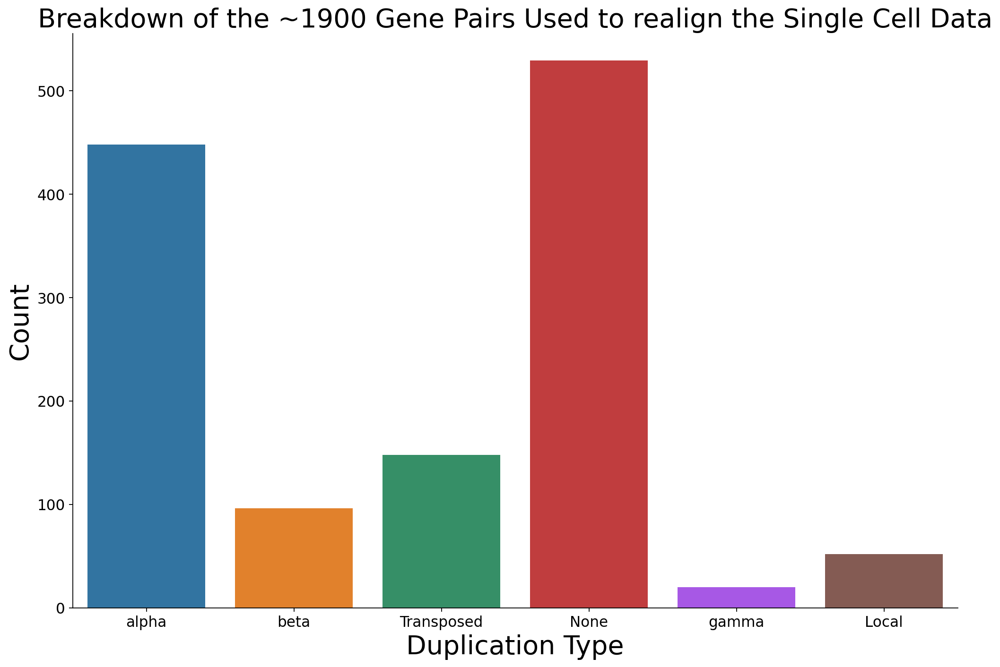

In [154]:
fig, ax = plt.subplots(figsize = (15,10))

ax = sns.countplot(data = analysis_of_duplications,x = 'Subtype', dodge= False)

fig.patch.set_facecolor('white')

sns.despine()
ax.grid(False)
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_color("black")

#plt.xlim(.5,.98)
#plt.ylim(.3,1)
plt.xlabel("Duplication Type", fontsize = 25)
plt.ylabel("Count", fontsize = 25)


plt.title("Breakdown of the ~1900 Gene Pairs Used to realign the Single Cell Data", fontsize = 25)
#plt.xticks(fontsize = 15, rotation = 30)
#plt.yticks(fontsize = 15)
#ax.set_xticklabels(labels = meta_cluster_labels_from_1_to_9)
#plt.legend(fontsize= 14,markerscale = 2.5, title = 'Gene', title_fontsize = 20)
#plt.savefig('/home/passala/Gene_duplication_project/Figures/Function_Investigation_Plots/poster_figure.jpg',dpi = 800)


In [155]:
alpha_half_of_cells.var['Alpha Gene'] = alpha_half_of_cells.var_names
beta_half_of_cells.var['Beta Gene'] = beta_half_of_cells.var_names
#alpha_half_of_cells.var = alpha_half_of_cells.var.merge(how = 'left', on= 'Alpha Gene', right = true_pair_dataframe)


In [156]:
beta_half_of_cells

AnnData object with n_obs × n_vars = 8317 × 11135
    obs: 'Cell Type', 'Study Number', 'Batch Cluster', 'Meta Cluster', 'Meta Cluster String', 'leiden'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Beta Gene'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'Meta Cluster String_colors', 'leiden', 'leiden_colors'
    obsm: 'X_umap', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [157]:
temp_var_df = alpha_half_of_cells.var.merge(how = 'left', on= 'Alpha Gene', right = true_pair_dataframe)
temp_var_df = temp_var_df.set_index('Alpha Gene', drop = False)
alpha_half_of_cells.var = temp_var_df

In [158]:
temp_var_df = beta_half_of_cells.var.merge(how = 'left', on= 'Beta Gene', right = true_pair_dataframe)
temp_var_df = temp_var_df.set_index('Beta Gene', drop = False)
beta_half_of_cells.var = temp_var_df

In [159]:
beta_half_of_cells.var.sort_values(by = 'Alpha Gene')

,highly_variable,means,dispersions,dispersions_norm,Beta Gene,Alpha Gene
Beta Gene,,,,,,
AT2G46830,False,3.030260,5.547686,0.280279,AT2G46830,AT1G01060
AT4G00820,False,3.473301,5.263610,-0.379627,AT4G00820,AT1G01110
AT4G00850,False,0.875709,5.206481,-0.058959,AT4G00850,AT1G01160
AT2G46510,False,4.391704,5.739597,0.000097,AT2G46510,AT1G01260
AT5G06420,True,1.246355,5.662952,0.727023,AT5G06420,AT1G01350
...,...,...,...,...,...,...
ATCG01070,True,1.015029,6.084265,1.452468,ATCG01070,NaN
ATCG01110,True,1.120116,5.799622,0.962350,ATCG01110,NaN
ATCG01120,True,1.645177,6.140377,1.432604,ATCG01120,NaN


In [160]:
alpha_half_of_cells.var.sort_values(by = 'Beta Gene')

,highly_variable,means,dispersions,dispersions_norm,Alpha Gene,Beta Gene
Alpha Gene,,,,,,
AT3G61820,True,3.318204,5.995403,1.082235,AT3G61820,AT1G01300
AT4G28080,True,1.263881,5.665480,0.616869,AT4G28080,AT1G01320
AT4G11330,False,1.568574,5.194240,-0.118344,AT4G11330,AT1G01560
AT4G00680,False,5.685984,8.240157,2.019922,AT4G00680,AT1G01750
AT3G61070,False,4.608466,5.464798,-0.496680,AT3G61070,AT1G01820
...,...,...,...,...,...,...
ATCG01060,False,0.012398,3.697553,-1.238713,ATCG01060,NaN
ATCG01080,True,0.560692,6.680872,2.211752,ATCG01080,NaN
ATCG01090,True,1.633525,6.156569,1.407445,ATCG01090,NaN


In [161]:
alpha_half_of_cells.var.loc[~alpha_half_of_cells.var['Beta Gene'].isnull()].index.to_list()

['AT1G01060',
 'AT1G01110',
 'AT1G01160',
 'AT1G01260',
 'AT1G01350',
 'AT1G01540',
 'AT1G01640',
 'AT1G01780',
 'AT1G01950',
 'AT1G02130',
 'AT1G02360',
 'AT1G02520',
 'AT1G02690',
 'AT1G02816',
 'AT1G03280',
 'AT1G03680',
 'AT1G04000',
 'AT1G04030',
 'AT1G04080',
 'AT1G04270',
 'AT1G04340',
 'AT1G04520',
 'AT1G04930',
 'AT1G04960',
 'AT1G05090',
 'AT1G05180',
 'AT1G05270',
 'AT1G05380',
 'AT1G05470',
 'AT1G05830',
 'AT1G06150',
 'AT1G06960',
 'AT1G07030',
 'AT1G07070',
 'AT1G07140',
 'AT1G07480',
 'AT1G07705',
 'AT1G08125',
 'AT1G08400',
 'AT1G08420',
 'AT1G08540',
 'AT1G09100',
 'AT1G09140',
 'AT1G09270',
 'AT1G09320',
 'AT1G09410',
 'AT1G09630',
 'AT1G09690',
 'AT1G09750',
 'AT1G09780',
 'AT1G10020',
 'AT1G10140',
 'AT1G10180',
 'AT1G10290',
 'AT1G10430',
 'AT1G10570',
 'AT1G11060',
 'AT1G11130',
 'AT1G11420',
 'AT1G11660',
 'AT1G12460',
 'AT1G12620',
 'AT1G12730',
 'AT1G12820',
 'AT1G12920',
 'AT1G13260',
 'AT1G13380',
 'AT1G13520',
 'AT1G13580',
 'AT1G13880',
 'AT1G13950',
 'AT1G

In [162]:
alpha_genes_shared_between_groups = alpha_half_of_cells.var.loc[~alpha_half_of_cells.var['Beta Gene'].isnull()].index.to_list()
beta_genes_shared_between_groups = beta_half_of_cells.var.loc[~beta_half_of_cells.var['Alpha Gene'].isnull()].index.to_list()
alpha_half_of_cells_without_genes = alpha_half_of_cells.copy()
alpha_half_of_cells_without_genes = alpha_half_of_cells_without_genes[:,alpha_genes_shared_between_groups]
beta_half_of_cells_without_genes = beta_half_of_cells.copy()
beta_half_of_cells_without_genes = beta_half_of_cells_without_genes[:,beta_genes_shared_between_groups]


In [163]:
beta_half_of_cells_without_genes.var

,highly_variable,means,dispersions,dispersions_norm,Beta Gene,Alpha Gene
Beta Gene,,,,,,
AT1G01300,False,3.601295,5.239812,-0.419877,AT1G01300,AT3G61820
AT1G01320,False,0.964359,5.148198,-0.159315,AT1G01320,AT4G28080
AT1G01560,True,1.246570,5.673592,0.745342,AT1G01560,AT4G11330
AT1G01750,False,5.516187,7.751650,1.713971,AT1G01750,AT4G00680
AT1G01820,False,3.619971,5.144614,-0.580889,AT1G01820,AT3G61070
...,...,...,...,...,...,...
AT5G66960,False,0.249079,4.584829,-0.236155,AT5G66960,AT1G50380
AT5G67020,False,1.144475,5.280444,0.068394,AT5G67020,AT3G50340
AT5G67240,False,2.359793,5.280431,-0.036469,AT5G67240,AT5G05540


In [164]:
beta_half_of_cells_without_genes.var_names = beta_half_of_cells_without_genes.var['Alpha Gene']
beta_half_of_cells_without_genes.var

,highly_variable,means,dispersions,dispersions_norm,Beta Gene,Alpha Gene
Alpha Gene,,,,,,
AT3G61820,False,3.601295,5.239812,-0.419877,AT1G01300,AT3G61820
AT4G28080,False,0.964359,5.148198,-0.159315,AT1G01320,AT4G28080
AT4G11330,True,1.246570,5.673592,0.745342,AT1G01560,AT4G11330
AT4G00680,False,5.516187,7.751650,1.713971,AT1G01750,AT4G00680
AT3G61070,False,3.619971,5.144614,-0.580889,AT1G01820,AT3G61070
...,...,...,...,...,...,...
AT1G50380,False,0.249079,4.584829,-0.236155,AT5G66960,AT1G50380
AT3G50340,False,1.144475,5.280444,0.068394,AT5G67020,AT3G50340
AT5G05540,False,2.359793,5.280431,-0.036469,AT5G67240,AT5G05540


In [165]:
beta_half_of_cells_without_genes.obs['Set Half'] = 'Beta'
alpha_half_of_cells_without_genes.obs['Set Half'] = 'Alpha'


/tmp/ipykernel_1790968/78622965.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  alpha_half_of_cells_without_genes.obs['Set Half'] = 'Alpha'


In [166]:
alpha_half_of_cells_without_genes.obs.index = alpha_half_of_cells_without_genes.obs.index.str.decode('utf-8')
beta_half_of_cells_without_genes.obs.index = beta_half_of_cells_without_genes.obs.index.str.decode('utf-8')

In [167]:
alpha_half_of_cells_without_genes.obs

,Cell Type,Study Number,Batch Cluster,Meta Cluster,Meta Cluster String,leiden,Set Half
AAACCTGAGAGTGACC-1,14,1,23,1,1,2,Alpha
AAACCTGAGCGATTCT-1,15,1,25,2,2,1,Alpha
AAACCTGAGGCTCATT-1,15,1,25,2,2,1,Alpha
AAACCTGCAAGTAGTA-1,3,1,4,5,5,3,Alpha
AAACCTGGTTATTCTC-1,14,1,23,1,1,1,Alpha
...,...,...,...,...,...,...,...
WT3_WT3_TTTGTCAGTCTGCGGT,8,3,43,7,7,4,Alpha
WT3_WT3_TTTGTCAGTTCCACTC,12,3,47,5,5,3,Alpha
WT3_WT3_TTTGTCATCCTCCTAG,1,3,41,4,4,0,Alpha
WT3_WT3_TTTGTCATCTCGATGA,10,3,45,2,2,6,Alpha


In [168]:
beta_half_of_cells_without_genes.obs

,Cell Type,Study Number,Batch Cluster,Meta Cluster,Meta Cluster String,leiden,Set Half
AAACCTGAGAAGGTTT-1,10,1,15,8,8,0,Beta
AAACCTGAGGGTGTTG-1,15,1,25,2,2,4,Beta
AAACCTGCAATAGCGG-1,14,1,23,1,1,2,Beta
AAACCTGGTCTGCAAT-1,15,1,25,2,2,4,Beta
AAACCTGGTGTTGAGG-1,8,1,11,7,7,7,Beta
...,...,...,...,...,...,...,...
WT3_WT3_TTTCCTCTCTGGTATG,8,3,43,7,7,6,Beta
WT3_WT3_TTTGCGCAGTGTTTGC,10,3,45,2,2,8,Beta
WT3_WT3_TTTGGTTAGAACTGTA,1,3,41,4,4,0,Beta
WT3_WT3_TTTGGTTCACGCATCG,1,3,41,4,4,0,Beta


In [169]:
#concatenated_alpha_beta_database = alpha_half_of_cells_without_genes.concatenate(beta_half_of_cells_without_genes)
#concatenated_alpha_beta_database

In [170]:
# Default-  No integration, completely seperate clusters

# sc.pp.highly_variable_genes(concatenated_alpha_beta_database, min_mean=0.0125, max_mean=4.5, min_disp=0.5)

# sc.pl.highly_variable_genes(concatenated_alpha_beta_database)
# sc.tl.pca(concatenated_alpha_beta_database, svd_solver='arpack', random_state= 219)
# sc.pp.neighbors(concatenated_alpha_beta_database, n_neighbors=10, n_pcs=50, random_state= 45)
# sc.tl.umap(concatenated_alpha_beta_database, random_state= 912)
# sc.pl.umap(concatenated_alpha_beta_database, color= ['Set Half', 'Meta Cluster String'], s = 40,)

In [171]:
## BBKNN - Ok Integration, still a big blob
# import bbknn
# bbknn.bbknn(adata = concatenated_alpha_beta_database, batch_key= 'Set Half')
# sc.tl.umap(concatenated_alpha_beta_database, random_state= 202)
# sc.pl.umap(concatenated_alpha_beta_database, color= 'Meta Cluster String', s = 30,)

/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


[[0.         0.67335898]
 [0.         0.        ]]
Processing datasets Alpha <=> Beta


/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


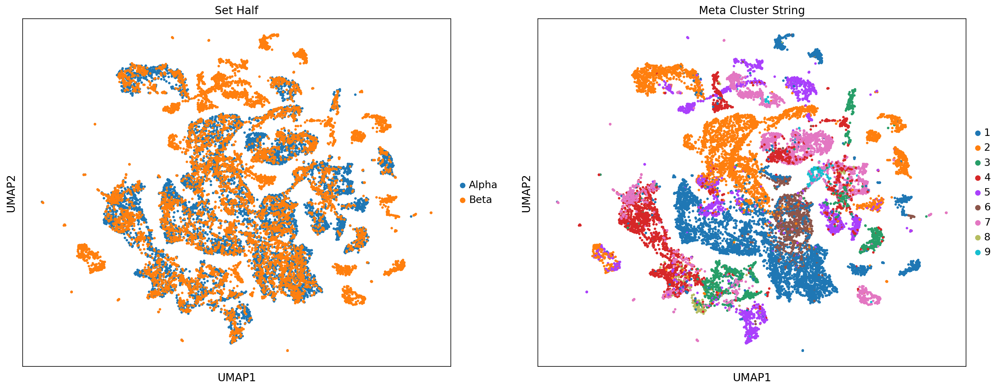

In [193]:
## Scanorama Just Integrate, kinda works but not all clusters well integrated
import scanorama
concatenated_alpha_beta_database = alpha_half_of_cells_without_genes.concatenate(beta_half_of_cells_without_genes)
#sc.tl.pca(concatenated_alpha_beta_database, svd_solver='arpack', )

sc.external.pp.scanorama_integrate(concatenated_alpha_beta_database,'Set Half')
sc.pp.neighbors(concatenated_alpha_beta_database, n_neighbors = 10, n_pcs = 40, use_rep= 'X_scanorama', random_state = 2204)
sc.tl.umap(concatenated_alpha_beta_database, random_state= 243)
sc.pl.umap(concatenated_alpha_beta_database, color= ['Set Half', 'Meta Cluster String'], s = 40,)


In [194]:
concatenated_alpha_beta_database.obs['Meta Cluster ID'] = concatenated_alpha_beta_database.obs['Meta Cluster String'].map(meta_cluster_ID)


In [190]:
#concatenated_alpha_beta_database.obs = concatenated_alpha_beta_database.obs.rename(columns={'Set Half':'Pseudo Dataset','Meta Cluster ID':'Cell Type'})

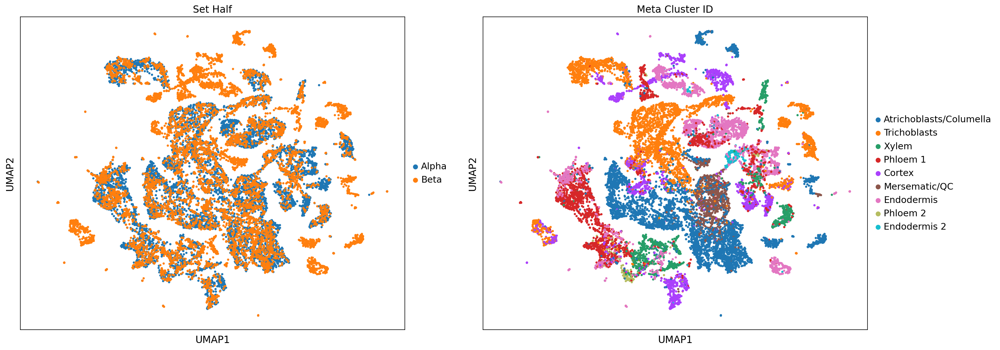

In [195]:
sc.pl.umap(concatenated_alpha_beta_database, color= ['Set Half', 'Meta Cluster ID'], s = 40,)

In [212]:
concatenated_alpha_beta_database.obs

,Cell Type,Study Number,Batch Cluster,Meta Cluster,Meta Cluster String,leiden,Set Half,batch,Meta Cluster ID
AAACCTGAGAGTGACC-1-0,14,1,23,1,1,2,Alpha,0,Atrichoblasts/Columella
AAACCTGAGCGATTCT-1-0,15,1,25,2,2,1,Alpha,0,Trichoblasts
AAACCTGAGGCTCATT-1-0,15,1,25,2,2,1,Alpha,0,Trichoblasts
AAACCTGCAAGTAGTA-1-0,3,1,4,5,5,3,Alpha,0,Cortex
AAACCTGGTTATTCTC-1-0,14,1,23,1,1,1,Alpha,0,Atrichoblasts/Columella
...,...,...,...,...,...,...,...,...,...
WT3_WT3_TTTCCTCTCTGGTATG-1,8,3,43,7,7,6,Beta,1,Endodermis
WT3_WT3_TTTGCGCAGTGTTTGC-1,10,3,45,2,2,8,Beta,1,Trichoblasts
WT3_WT3_TTTGGTTAGAACTGTA-1,1,3,41,4,4,0,Beta,1,Phloem 1
WT3_WT3_TTTGGTTCACGCATCG-1,1,3,41,4,4,0,Beta,1,Phloem 1


In [ ]:
sc.settings.figdir = '/data/passala/Plots_for_projects/Coexpressolog_paper_plots'

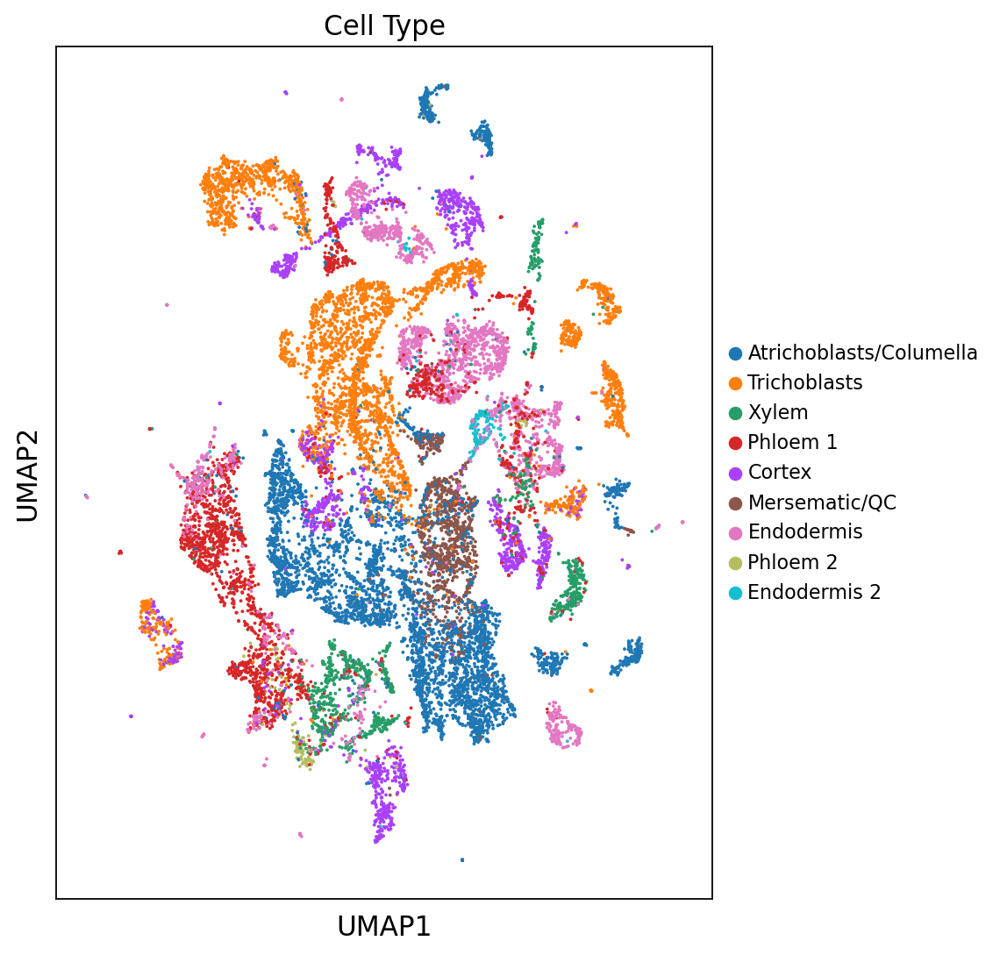

In [238]:
sc.set_figure_params(dpi_save = 500, figsize = (6,8))
sc.pl.umap(concatenated_alpha_beta_database, color= ['Meta Cluster ID'], s=12, legend_fontsize = 10, title = "Cell Type", )

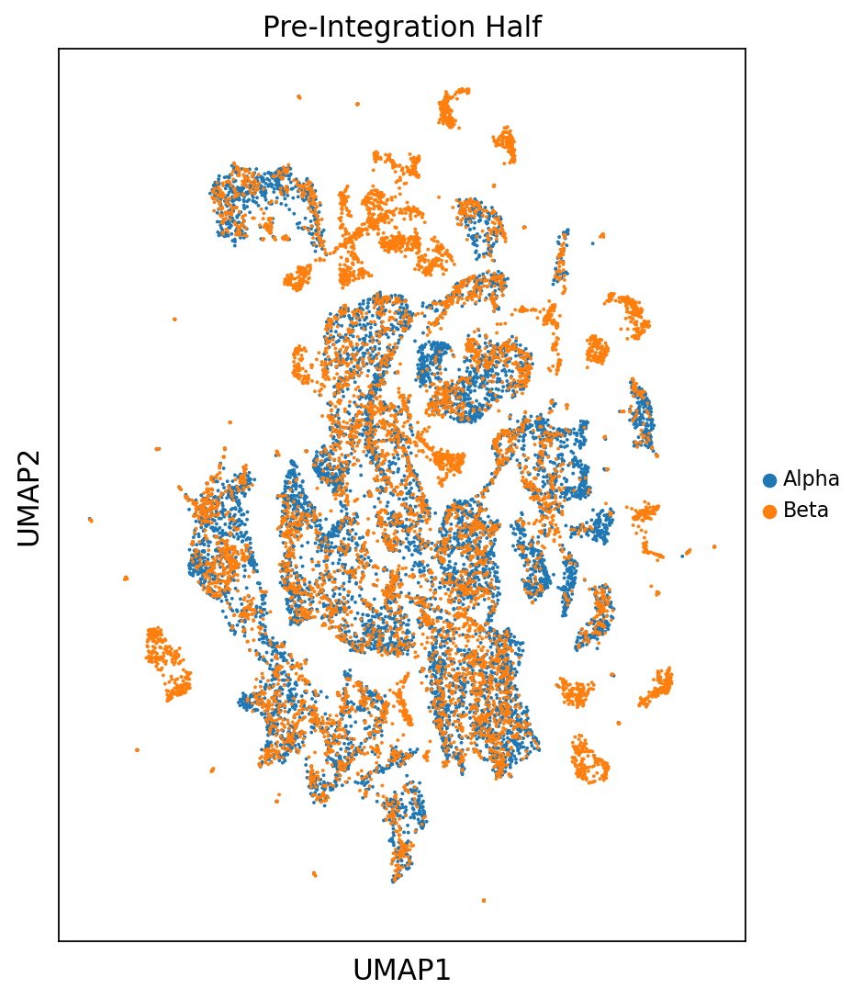

In [239]:
sc.pl.umap(concatenated_alpha_beta_database, color= ['Set Half'], s=12, legend_fontsize = 10, title = "Pre-Integration Half", )

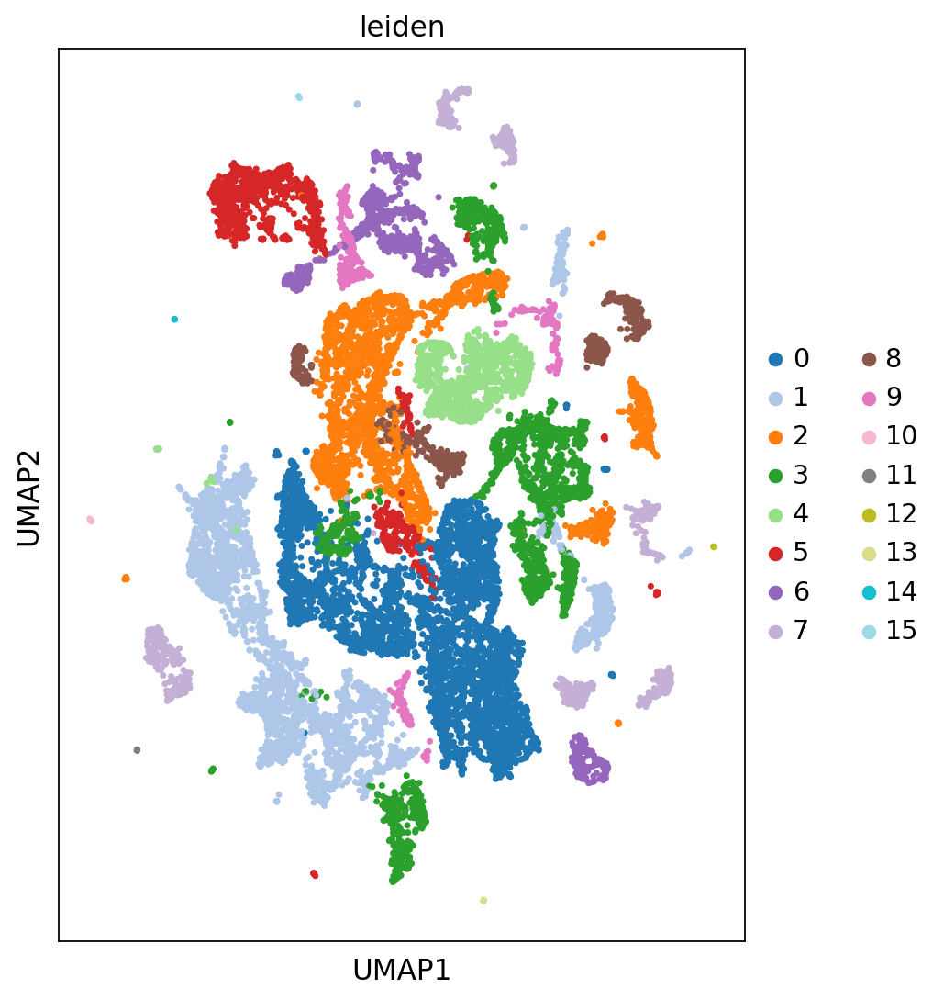

In [263]:
sc.tl.leiden(concatenated_alpha_beta_database, random_state= 33, resolution = .07)

sc.pl.umap(concatenated_alpha_beta_database, color= 'leiden', s = 40, palette = 'tab20')

In [264]:
concatenated_alpha_beta_database.obs['leiden'].value_counts()

0     4214
1     2883
2     2496
3     2073
4     1067
5     1064
6      914
7      865
8      582
9      436
10       9
11       8
12       8
13       6
14       5
15       5
Name: leiden, dtype: int64

In [265]:
real_clusters = concatenated_alpha_beta_database.obs['leiden'].value_counts()[concatenated_alpha_beta_database.obs['leiden'].value_counts() > 15].index.to_list()

In [266]:
real_clusters

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

In [267]:
trimmed_alpha_beta = concatenated_alpha_beta_database[concatenated_alpha_beta_database.obs['leiden'].isin(real_clusters),:]
trimmed_alpha_beta

View of AnnData object with n_obs × n_vars = 16594 × 736
    obs: 'Cell Type', 'Study Number', 'Batch Cluster', 'Meta Cluster', 'Meta Cluster String', 'leiden', 'Set Half', 'batch', 'Meta Cluster ID'
    var: 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'Alpha Gene-0', 'Beta Gene-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'Alpha Gene-1', 'Beta Gene-1'
    uns: 'neighbors', 'umap', 'Set Half_colors', 'Meta Cluster String_colors', 'leiden', 'leiden_colors', 'Meta Cluster ID_colors'
    obsm: 'X_umap', 'X_pca', 'X_scanorama'
    obsp: 'distances', 'connectivities'

In [268]:
number_cells_in_cluster_with_majority_one_cell_type = 0
number_cells_in_cluster_with_multiple_Cell_types = 0
number_cells_in_mixed_dataset = 0
number_cells_in_single_dataset = 0
for leiden_cluster in real_clusters:
    current_cell_group = trimmed_alpha_beta.obs.loc[trimmed_alpha_beta.obs['leiden'] == leiden_cluster]
    if current_cell_group['Meta Cluster ID'].value_counts(normalize = True).max() > .6:
        number_cells_in_cluster_with_majority_one_cell_type+= len(current_cell_group)
    else:
        number_cells_in_cluster_with_multiple_Cell_types += len(current_cell_group)
    if current_cell_group['batch'].value_counts(normalize = True).max() < .7:
        number_cells_in_mixed_dataset += len(current_cell_group)
    else: 
        number_cells_in_single_dataset+= len(current_cell_group)

In [269]:
total_cells = len(trimmed_alpha_beta.obs)
percent_cells_in_majority_one_cell_type = number_cells_in_cluster_with_majority_one_cell_type/total_cells
print(percent_cells_in_majority_one_cell_type)

0.6462576835000603


In [270]:
percent_cells_in_mixed = number_cells_in_mixed_dataset/total_cells
print(percent_cells_in_mixed)

0.8314451006387851


In [ ]:
current_cell_group

,Cell Type,Study Number,Batch Cluster,Meta Cluster,Meta Cluster String,leiden,Set Half,batch,Meta Cluster ID
AAAGTAGTCCACTCCA.1-0,6,2,9,9,9,5,Alpha,0,Endodermis 2
CCGTTCAGTACAGTTC.1-0,6,2,9,9,9,5,Alpha,0,Endodermis 2
CGTCCATGTCAATACC.1-0,6,2,9,9,9,5,Alpha,0,Endodermis 2
CTCGAAAGTGCAGGTA.1-0,6,2,9,9,9,5,Alpha,0,Endodermis 2
GGGCATCCAAGTCTAC.1-0,6,2,9,9,9,5,Alpha,0,Endodermis 2
...,...,...,...,...,...,...,...,...,...
WT3_WT3_TGGTTCCTCGCTGATA-1,1,3,41,4,4,5,Beta,1,Phloem 1
WT3_WT3_TTCGGTCTCTGCTTGC-1,1,3,41,4,4,5,Beta,1,Phloem 1
WT3_WT3_TTCTCAATCGATAGAA-1,8,3,43,7,7,5,Beta,1,Endodermis
WT3_WT3_TTGCGTCAGTTTGCGT-1,8,3,43,7,7,5,Beta,1,Endodermis


In [ ]:
current_cell_group['Meta Cluster ID'].value_counts(normalize = True).max()

0.8197781885397413

In [ ]:
# Scanorama Integrate and Correct,Doesn't Work at all
# import scanorama
# corrected = scanorama.correct_scanpy([alpha_half_of_cells_without_genes,beta_half_of_cells_without_genes], return_dimred=True)
# corrected_scanorama = corrected[0].concatenate(corrected[1])
# sc.pp.neighbors(corrected_scanorama, n_neighbors = 10, n_pcs = 40, use_rep= 'X_scanorama', random_state = 2204)
# sc.tl.umap(corrected_scanorama, random_state= 243)
# sc.pl.umap(corrected_scanorama, color= ['Set Half', 'Meta Cluster String'], s = 40,)

#sc.pl.umap(corrected_scanorama, color= 'Meta Cluster String', s = 30,)

In [ ]:
### MNN Method- Doens't Work
# import mnnpy
# order_of_vars = alpha_half_of_cells_without_genes.var.index.to_list()
# current_order_beta_vars = beta_half_of_cells_without_genes.var_names
# panda_version_of_beta_x_data = pd.DataFrame(columns = current_order_beta_vars, data = beta_half_of_cells_without_genes.X)

# re_ordered_version = panda_version_of_beta_x_data.reindex(columns = order_of_vars)
# beta_half_of_cells_without_genes.X = re_ordered_version
# beta_half_of_cells_without_genes.var = beta_half_of_cells_without_genes.var.reindex(order_of_vars)

# hvgs = list(set(beta_half_of_cells_without_genes.var.loc[beta_half_of_cells_without_genes.var['highly_variable']==True].index.to_list()+alpha_half_of_cells_without_genes.var.loc[alpha_half_of_cells_without_genes.var['highly_variable']==True].index.to_list()))


# mnn_corrected_database = mnnpy.mnn_correct(alpha_half_of_cells_without_genes,beta_half_of_cells_without_genes,do_concatenate= True, batch_categories= ['Alpha','Beta'], var_subset= hvgs)
# # mnn_corrected_database
# mnn_anndata_corrected = mnn_corrected_database[0]
# mnn_anndata_corrected = mnn_anndata_corrected[:,hvgs]

# sc.tl.pca(mnn_anndata_corrected, svd_solver='arpack', random_state= 219, use_highly_variable= False)
# sc.pp.neighbors(mnn_anndata_corrected, n_neighbors=10, n_pcs=50, random_state= 45)
# sc.tl.umap(mnn_anndata_corrected, random_state= 912)
# sc.pl.umap(mnn_anndata_corrected, color= ['Set Half', 'Meta Cluster String'], s = 40,)


In [ ]:
## Scanpy Ingest 
order_of_vars = alpha_half_of_cells_without_genes.var.index.to_list()
current_order_beta_vars = beta_half_of_cells_without_genes.var_names
panda_version_of_beta_x_data = pd.DataFrame(columns = current_order_beta_vars, data = beta_half_of_cells_without_genes.X)

re_ordered_version = panda_version_of_beta_x_data.reindex(columns = order_of_vars)
beta_half_of_cells_without_genes.X = re_ordered_version
beta_half_of_cells_without_genes.var = beta_half_of_cells_without_genes.var.reindex(order_of_vars)

sc.tl.ingest(adata = beta_half_of_cells_without_genes, adata_ref = alpha_half_of_cells_without_genes, obs = 'leiden')
beta_half_of_cells_without_genes.uns['leiden_colors'] = alpha_half_of_cells_without_genes.uns['leiden_colors']  # fix colors

In [ ]:
sc.pl.umap(beta_half_of_cells_without_genes, color='leiden', wspace=0.5, s = 40, palette= 'tab10')

In [ ]:
sc.pl.umap(alpha_half_of_cells_without_genes, color = 'leiden', palette = 'tab10')

In [ ]:
concatenated_alpha_beta_database = alpha_half_of_cells_without_genes.concatenate(beta_half_of_cells_without_genes)


In [ ]:
sc.pl.umap(concatenated_alpha_beta_database, color= ['Set Half', 'Meta Cluster String'], s= 20,)


In [ ]:

sc.tl.ingest(adata = alpha_half_of_cells_without_genes, adata_ref = beta_half_of_cells_without_genes, obs = 'leiden')
alpha_half_of_cells_without_genes.uns['leiden_colors'] = beta_half_of_cells_without_genes.uns['leiden_colors']  # fix colors

In [ ]:
sc.pl.umap(alpha_half_of_cells_without_genes, color='leiden', wspace=0.5, s = 40, palette= 'tab10')